In [1]:
from keras.datasets.cifar10 import load_data

(trainX, trainy), (testX, testy) = load_data()

print('train', trainX.shape, trainy.shape)
print('train', testX.shape, testy.shape)

Using TensorFlow backend.


170500096/170498071 [==============================] - 2s 0us/step: 
train (50000, 32, 32, 3) (50000, 1)
train (10000, 32, 32, 3) (10000, 1)


In [2]:
import numpy as np

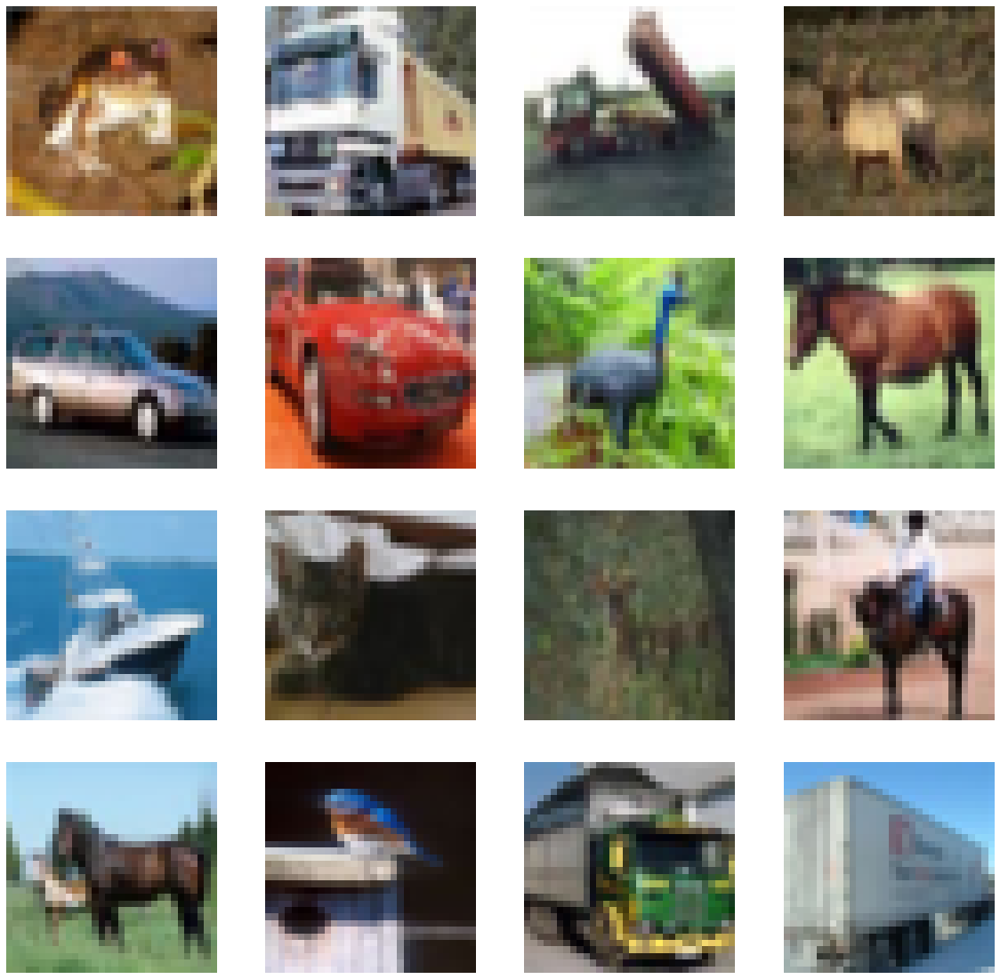

In [3]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(20,20))
for i in np.arange(16):
    
    plt.subplot(4,4,i+1)
    plt.axis('off')
    plt.imshow(trainX[i])

# 32 logo dataset

In [1]:
def from_s3_npy(s3_uri: str):
    bytes_ = BytesIO()
    parsed_s3 = urlparse(s3_uri)
    client.download_fileobj(
        Fileobj=bytes_, Bucket=parsed_s3.netloc, Key=parsed_s3.path[1:]
    )
    bytes_.seek(0)
    return np.load(bytes_, allow_pickle=True)

In [2]:
from io import BytesIO
import numpy as np
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import boto3
client = boto3.client("s3")

In [3]:
c = from_s3_npy('s3://verafin-mitacs-yifu-chen/224/')

In [4]:
c=c[0:6080]

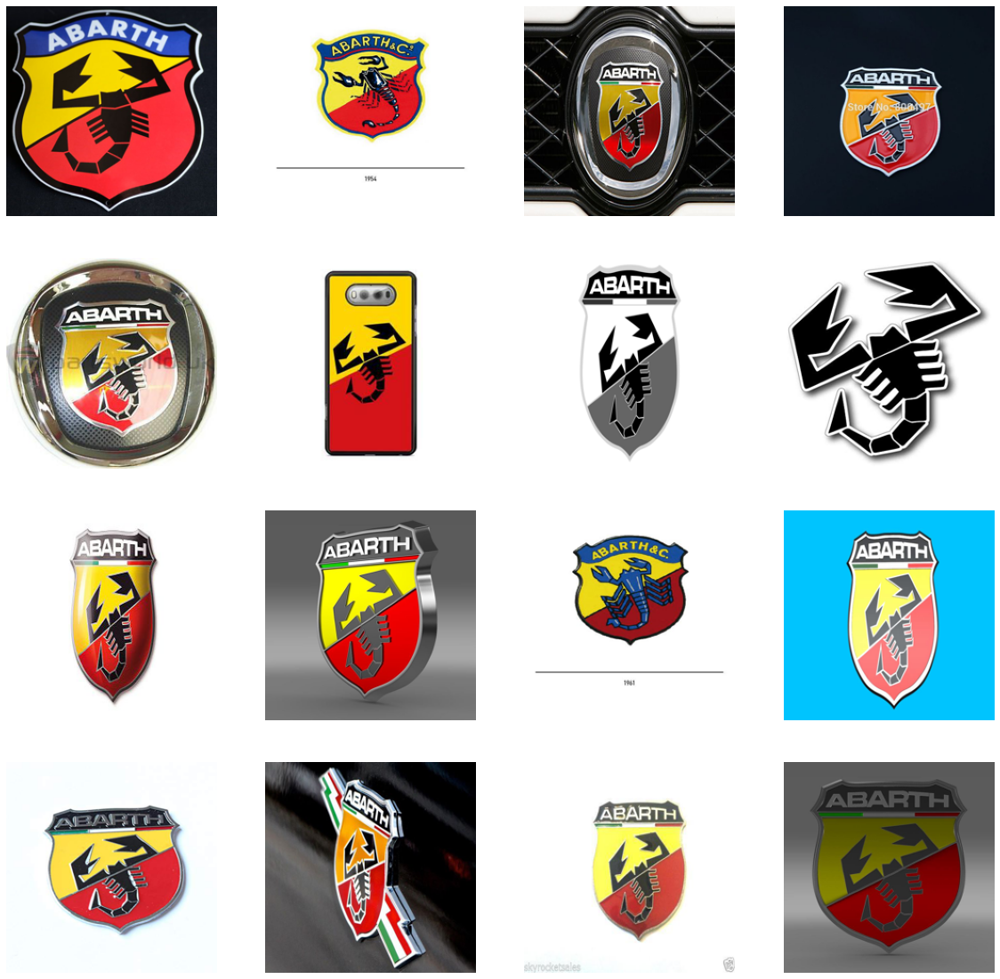

In [5]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(20,20))
for i in np.arange(16):
    
    plt.subplot(4,4,i+1)
    plt.axis('off')
    plt.imshow(c[i])

In [6]:
c.shape

(6080, 224, 224, 3)

# Checks

In [3]:
def from_s3_npy(s3_uri: str):
    bytes_ = BytesIO()
    parsed_s3 = urlparse(s3_uri)
    client.download_fileobj(
        Fileobj=bytes_, Bucket=parsed_s3.netloc, Key=parsed_s3.path[1:]
    )
    bytes_.seek(0)
    return np.load(bytes_, allow_pickle=True)

In [4]:
from io import BytesIO
import numpy as np
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import boto3
client = boto3.client("s3")

In [5]:
c = from_s3_npy('s3://verafin-mitacs-yifu-chen/32_checks/')

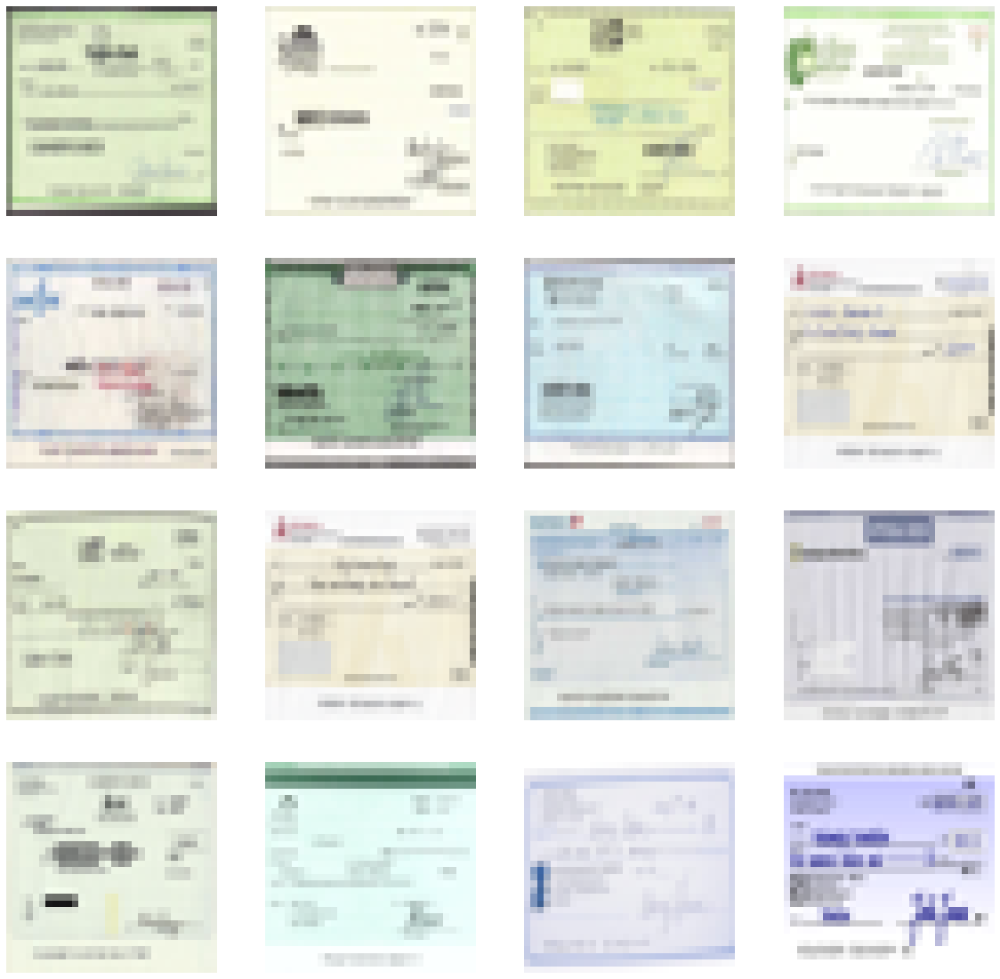

In [6]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(20,20))
for i in np.arange(16):
    
    plt.subplot(4,4,i+1)
    plt.axis('off')
    plt.imshow(c[i])

In [7]:
c.shape

(158, 32, 32, 3)

# Signatures -handwriting

In [48]:
from io import BytesIO
import numpy as np
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import boto3
import PIL
from PIL import Image
from io import BytesIO
s3_client = boto3.client('s3')
paginator = s3_client.get_paginator('list_objects_v2')
bucket = 'verafin-mitacs-yifu-chen'
key ='validation'

In [49]:
images=[]
variants=[]

In [50]:
pages = paginator.paginate(Bucket=bucket, Prefix=key)
for page in pages:
    for obj in page['Contents']:
        img_key=obj['Key']
        file_byte_string = s3_client.get_object(Bucket = bucket, Key=img_key)['Body'].read()
        im = Image.open(BytesIO(file_byte_string))
        im = im.resize((256,32))
        im = np.array(im)           
        if im.shape == (256,32,3):
            images.append(im)
        else:
            variants.append(im)

In [52]:
variants[0].shape

(32, 256, 3)

In [54]:
from io import BytesIO
import numpy as np
from urllib.parse import urlparse
import boto3
client = boto3.client("s3")

def to_s3_npy(data: np.array, s3_uri: str):
    # s3_uri looks like f"s3://{BUCKET_NAME}/{KEY}"
    bytes_ = BytesIO()
    np.save(bytes_, data, allow_pickle=True)
    bytes_.seek(0)
    parsed_s3 = urlparse(s3_uri)
    client.upload_fileobj(
        Fileobj=bytes_, Bucket=parsed_s3.netloc, Key=parsed_s3.path[1:]
    )
    return True

In [57]:
x = np.array(variants)

In [58]:
x.shape

(4663, 32, 256, 3)

In [59]:
to_s3_npy(x, 's3://verafin-mitacs-yifu-chen/32_256_signature/')

True

In [96]:
def from_s3_npy(s3_uri: str):
    bytes_ = BytesIO()
    parsed_s3 = urlparse(s3_uri)
    client.download_fileobj(
        Fileobj=bytes_, Bucket=parsed_s3.netloc, Key=parsed_s3.path[1:]
    )
    bytes_.seek(0)
    return np.load(bytes_, allow_pickle=True)

In [5]:
c = from_s3_npy('s3://verafin-mitacs-yifu-chen/validation_31_248/')

In [7]:
c[3930].shape

(31, 284, 3)

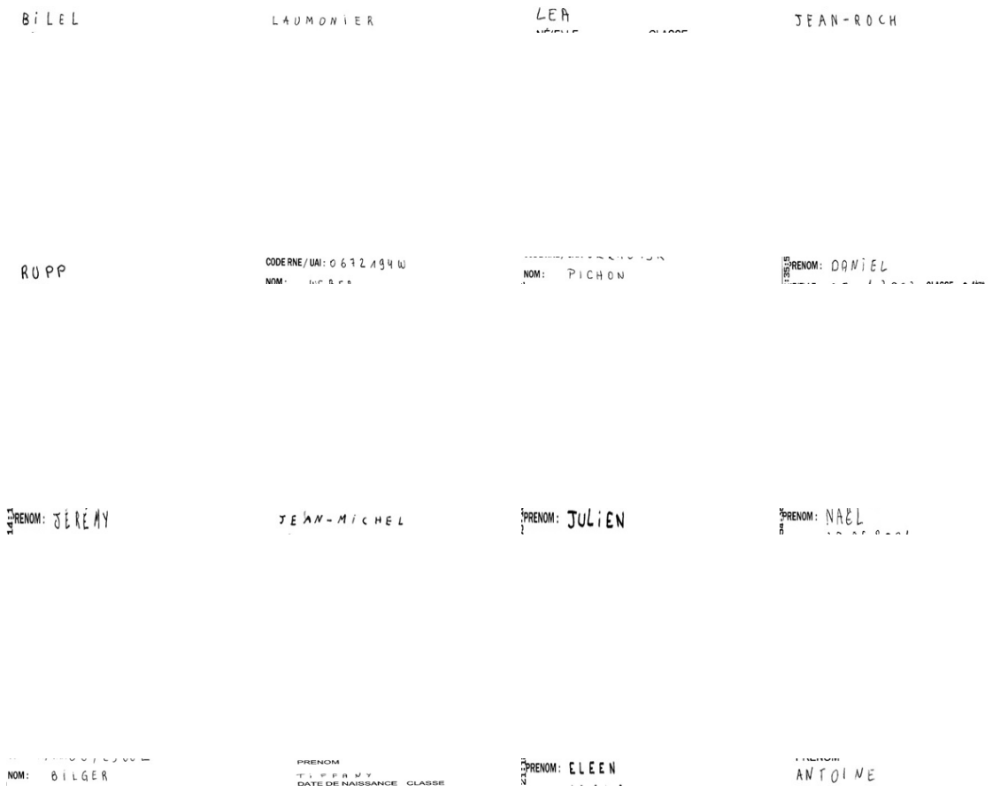

In [53]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(20,20))
for i in np.arange(16):
    
    plt.subplot(4,4,i+1)
    plt.axis('off')
    plt.imshow(variants[i])

# Signature

In [1]:
from io import BytesIO
import numpy as np
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import boto3
import PIL
from PIL import Image
from io import BytesIO
s3_client = boto3.client('s3')
paginator = s3_client.get_paginator('list_objects_v2')
bucket = 'verafin-mitacs-yifu-chen'
key ='signature-true'

In [2]:
images=[]
variants=[]

In [3]:
pages = paginator.paginate(Bucket=bucket, Prefix=key)
for page in pages:
    for obj in page['Contents'][2:]:
        img_key=obj['Key']
        file_byte_string = s3_client.get_object(Bucket = bucket, Key=img_key)['Body'].read()
        im = Image.open(BytesIO(file_byte_string))
        im = im.resize((256,32))
        im = np.array(im)           
        if im.shape == (256,32,3):
            images.append(im)
        else:
            variants.append(im)

In [4]:
print(len(variants))
print(variants[0].shape)

1176
(32, 256)


In [5]:
x = []
x1=[]
for i in variants:
    if i.shape == (32,256,3):
        x.append(i)
    else:
        x1.append(i) 
print(len(x))
print(len(x1))

135
1041


In [6]:
print(x[0].shape)
print(x1[0].shape)

(32, 256, 3)
(32, 256)


In [7]:
x2 = []
for i in x1:
    i = np.repeat(i.reshape(32, 256, 1), 3, axis=2)
    x2.append(i)
print(x2[30].shape)

(32, 256, 3)


In [8]:
x = x+x2
x=np.array(x)
print(x.shape)

(1176, 32, 256, 3)


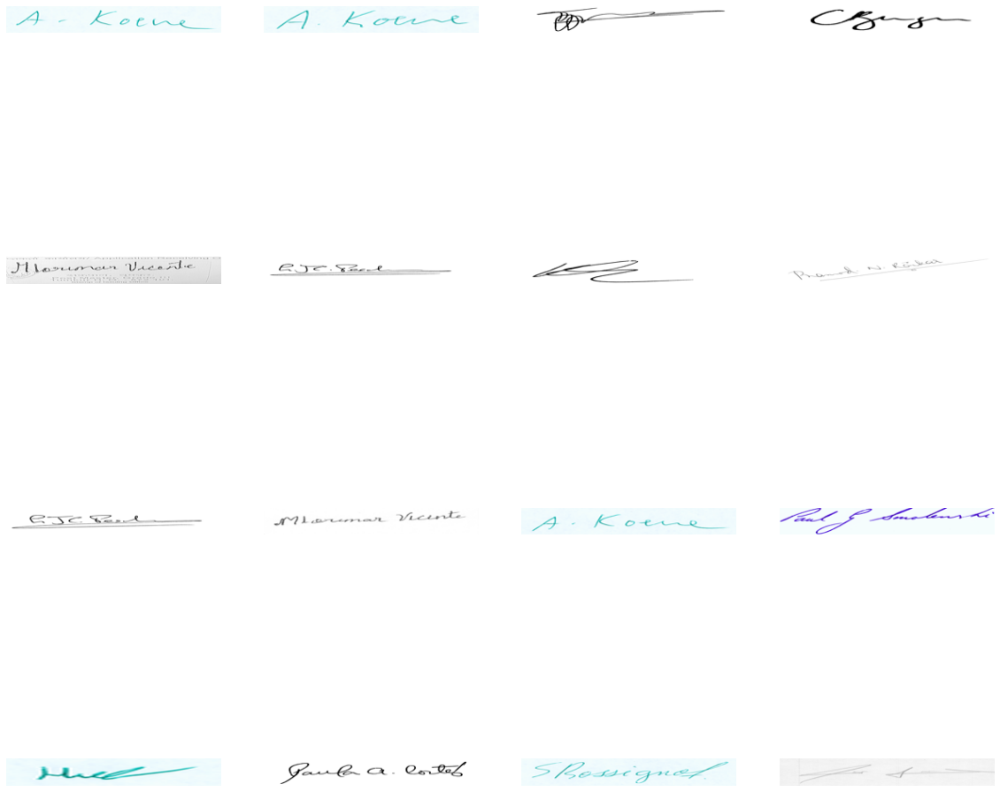

In [9]:
# random samplingly visuliaze  the original datasets
import matplotlib.pyplot as plt
num = np.random.randint(low = 0, high = 370, size = 16)
fig = plt.figure(figsize=(20,20))
for i in np.arange(16):
    
    plt.subplot(4,4,i+1)
    plt.axis('off')
    plt.imshow(x[num[i]])

# GAN

In [10]:
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Dense
from keras.layers import Conv2D
from keras.layers import Flatten
from keras.layers import Dropout
from keras.layers import LeakyReLU,Reshape,Conv2DTranspose
from keras.utils.vis_utils import plot_model

Using TensorFlow backend.


In [11]:
def discriminator(in_shape=(32,256,3)):
    model=Sequential()
    model.add(Conv2D(64, (3,3), padding='same', input_shape=in_shape))
    model.add(LeakyReLU(alpha=0.2))
    #dowmsampling
    model.add(Conv2D(128,(3,3), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    #downsampling
    model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    #downsampling
    model.add(Conv2D(256, (3,3), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    #classifier
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation='sigmoid'))
    #compile
    optimization = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=optimization, metrics=['acc'])
    
    return model

In [18]:
pip install pydot

Note: you may need to restart the kernel to use updated packages.


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 32, 256, 64)       1792      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 32, 256, 64)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 16, 128, 128)      73856     
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 16, 128, 128)      0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 8, 64, 128)        147584    
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 8, 64, 128)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 4, 32, 256)       

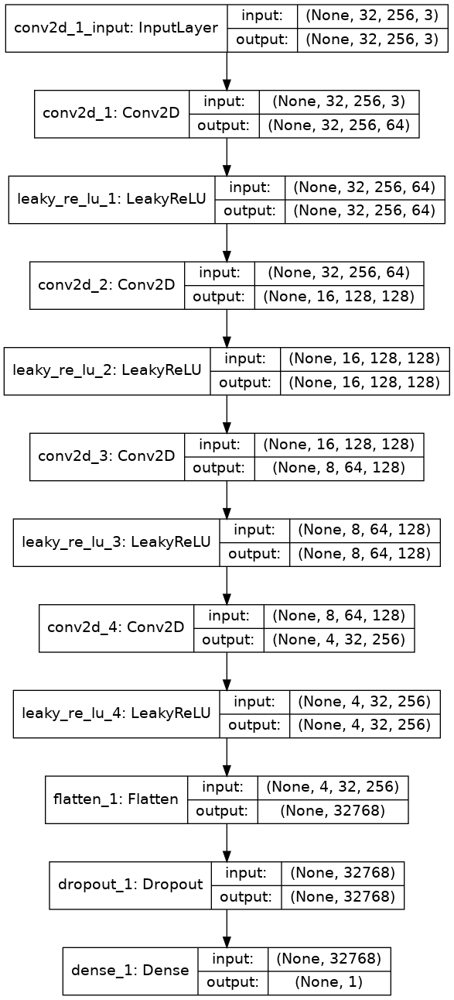

In [12]:
model = discriminator()
model.summary()

plot_model(model, to_file='discriminator_plot.png', show_shapes=True, show_layer_names=True)

In [13]:
#select real samples
def generate_real_samples(dataset, n_samples):
    #choose random instances
    ix = randint(0, dataset.shape[0], n_samples)
    #retrieve selected images
    X=dataset[ix]
    #generate 'real' class labels (1)
    y=ones((n_samples, 1))
    return X, y

In [14]:
from numpy import expand_dims
from numpy import ones
from numpy import zeros
from numpy.random import rand
from numpy.random import randint
from keras.datasets.cifar10 import load_data
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Conv2D
from keras.layers import Flatten
from keras.layers import Dropout
from keras.layers import LeakyReLU

In [15]:
#generate n fake samples with class labels
def generate_fake_samples(n_samples):
    #genrate uniform random numbers in [0,1]
    X = rand(32**3*n_samples)
    #update to have the range[-1,1]
    X= -1 + X * 2
    #reshape into a batch of color images
    X=X.reshape((n_samples, 32, 32, 3))
    #generate 'fake' class labels(0)
    y = zeros((n_samples, 1))
    return X, y

In [16]:
#generate n fake samples with class labels for handwrinting
def generate_fake_samples(n_samples):
    #genrate uniform random numbers in [0,1]
    X = rand(32*256*3*n_samples)
    #update to have the range[-1,1]
    X= -1 + X * 2
    #reshape into a batch of color images
    X=X.reshape((n_samples, 32, 256, 3))
    #generate 'fake' class labels(0)
    y = zeros((n_samples, 1))
    return X, y

In [17]:
def train_discriminator(model, dataset, n_iter=20, n_batch=128):
    half_batch = int(n_batch/2)
    #manually enumerate eopchs
    for i in range(n_iter):
        #get randomly selected 'real' samples
        X_real, y_real = generate_real_samples(dataset, half_batch)
        #update discriminator on real samples
        _, real_acc = model.train_on_batch(X_real, y_real)
        #generate ' fake' examples
        X_fake, y_fake = generate_fake_samples(half_batch)
        #update discriminator on fake samples
        _, fake_acc = model.train_on_batch(X_fake, y_fake)
        #summarize performance
        print('>%d real=%.0f%% fake=%.0f%%' % (i+1, real_acc*100, fake_acc*100))

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 32768)             3309568   
_________________________________________________________________
leaky_re_lu_13 (LeakyReLU)   (None, 32768)             0         
_________________________________________________________________
reshape_3 (Reshape)          (None, 4, 32, 256)        0         
_________________________________________________________________
conv2d_transpose_7 (Conv2DTr (None, 8, 64, 128)        524416    
_________________________________________________________________
leaky_re_lu_14 (LeakyReLU)   (None, 8, 64, 128)        0         
_________________________________________________________________
conv2d_transpose_8 (Conv2DTr (None, 16, 128, 128)      262272    
_________________________________________________________________
leaky_re_lu_15 (LeakyReLU)   (None, 16, 128, 128)     

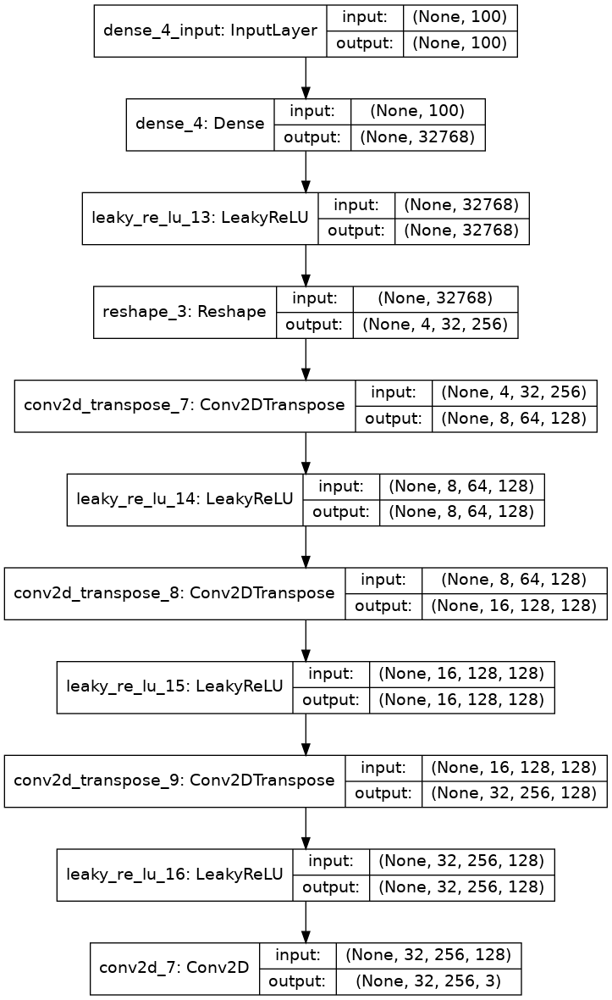

In [26]:
def generator(latent_dim):
    model = Sequential()
    n_nodes = 256 * 4 * 32
    model.add(Dense(n_nodes, input_dim=latent_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((4,32,256)))
    #upsampling to 8 * 64
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    #upsampling to 16 * 128
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    #upsampling to 32 * 256
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    #output layer
    model.add(Conv2D(3, (3,3), activation='tanh', padding='same'))
    return model

#define latent space
latent_dim = 100
model = generator(latent_dim)
model.summary()
plot_model(model, to_file='generator_plot.png', show_shapes=True, show_layer_names=True)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 4096)              413696    
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 4096)              0         
_________________________________________________________________
reshape_2 (Reshape)          (None, 4, 4, 256)         0         
_________________________________________________________________
conv2d_transpose_4 (Conv2DTr (None, 8, 8, 128)         524416    
_________________________________________________________________
leaky_re_lu_10 (LeakyReLU)   (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_transpose_5 (Conv2DTr (None, 16, 16, 128)       262272    
_________________________________________________________________
leaky_re_lu_11 (LeakyReLU)   (None, 16, 16, 128)      

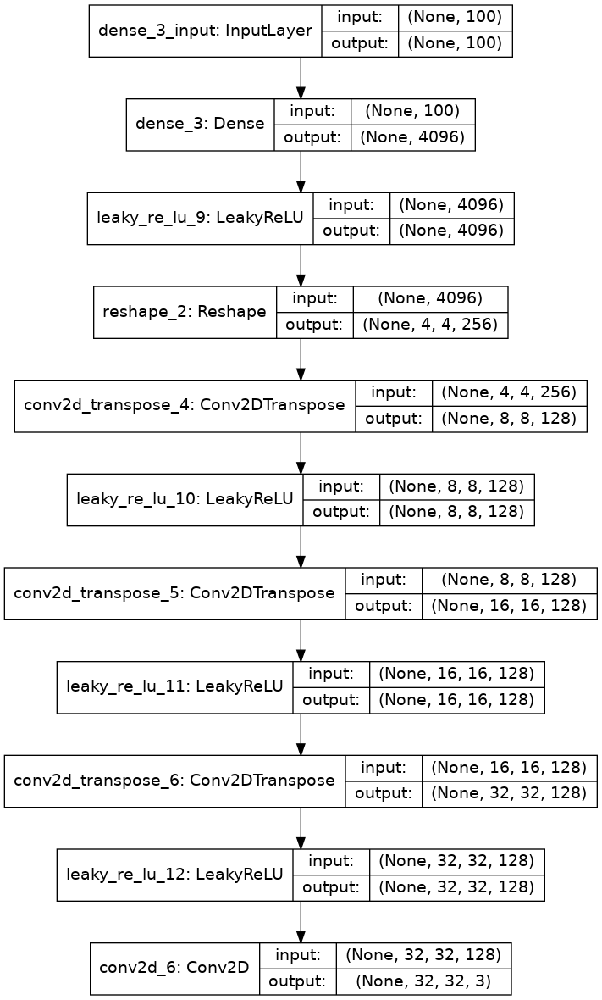

In [24]:
from numpy.random import randn
from keras.layers import Dense
from keras.layers import Reshape
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
#a smaller low-resolution version of te image works better in a first dense layer
#foundation of 4 * 4 image

def generator(latent_dim):
    model = Sequential()
    n_nodes = 256 * 4 * 4
    model.add(Dense(n_nodes, input_dim=latent_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((4,4,256)))
    #upsampling to 8 * 8
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    #upsampling to 16 * 16
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    #upsampling to 32 * 32
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    #output layer
    model.add(Conv2D(3, (3,3), activation='tanh', padding='same'))
    return model

#define latent space
latent_dim = 100
model = generator(latent_dim)
model.summary()
plot_model(model, to_file='generator_plot.png', show_shapes=True, show_layer_names=True)

In [19]:
# generate point in the latent space as input for the generator
def generate_latent_points(latent_dim, n_samples):
    #generate points in the latent space
    x_input = randn(latent_dim * n_samples)
    #reshape into a batch of inputs for the network
    x_input = x_input.reshape(n_samples, latent_dim)
    return x_input

In [20]:
# using the generator to generate n fake examples, with class labels
def generate_fake_samples(g_model, latent_dim, n_samples):
    # generate points in the latent space
    x_input = generate_latent_points(latent_dim, n_samples)
    # predict outputs
    X = g_model.predict(x_input)
    # create 'fake' class labels (0)
    y = zeros((n_samples, 1))
    
    return X, y

In [22]:
from numpy import expand_dims
from numpy import ones
from numpy import zeros
from numpy.random import rand
from numpy.random import randint
from keras.datasets.cifar10 import load_data
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Conv2D
from keras.layers import Flatten
from keras.layers import Dropout
from keras.layers import LeakyReLU

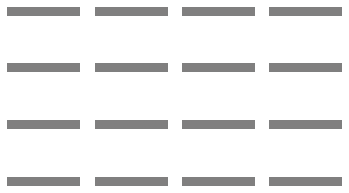

In [27]:
n_samples = 16
X, _ = generate_fake_samples(model, latent_dim, n_samples)
# scale pixel values from [-1, 1 to [0,1]]
X = (X + 1)/ 2

for i in range(n_samples):
    plt.subplot(4, 4, i+1)
    plt.axis('off')
    plt.imshow(X[i])

In [28]:
# define the combined generator and discriminator model, for updating the generator
def gan(g_model,d_model):
    # make weights in the discriminator not trainable
    d_model.trainable = False
    # connect them
    model = Sequential()
    # add generator
    model.add(g_model)
    # add disriminator
    model.add(d_model)
    # compile model
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    return model

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_5 (Sequential)    (None, 32, 256, 3)        4361987   
_________________________________________________________________
sequential_6 (Sequential)    (None, 1)                 551169    
Total params: 4,913,156
Trainable params: 4,361,987
Non-trainable params: 551,169
_________________________________________________________________


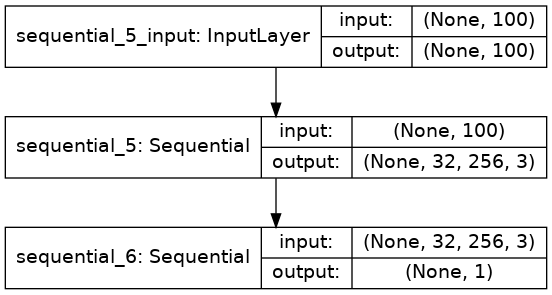

In [29]:
g_model = generator(latent_dim)
d_model = discriminator()
gan_model = gan(g_model, d_model)
gan_model.summary()
plot_model(gan_model, to_file='gan_plot.png', show_shapes=True, show_layer_names=True)

In [30]:
# train the composite model
# this is where you make the generated samples as real from the G
def train_gan(gan_model, latent_dim, n_epochs=20, n_batch=128):
    # manually enumerate epochs
    for i in range(n_epochs):
        # prepare points in latent space as inpt for the G
        x_gan = generate_latent_points(latent_dim, n_batch)
        #create inverted labels for the fake exmaples
        y_gan = ones((n_batch,1))
        # update the G via the D's error
        gan_model.train_on_batch(x_gan, y_gan)

* a few things to note in this model training function number of batches within an epoch is defined by how many times the batch size divides into the training dataset.
* the D model is updated twice per batch, once with real samples and once with fake samples, which is a best practice as opposed to combine the samples and performing a single update.
* Finally, we report the loss each batch. it is critical to keep an eye on the loss over batches. since a crash in the D loss indicates that the D model has started generating rubbish examples that the D can easily discriminate

In [31]:
# train the G and D
def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=200, n_batch=64):
    bat_per_epo = int(dataset.shape[0] / n_batch)
    half_batch = int(n_batch / 2)
    # manually enumerate epochs
    for i in range(n_epochs):
        # enumerate batches over the training set
        for j in range(bat_per_epo):
            # get randomly selected 'real' samples
            X_real, y_real = generate_real_samples(dataset, half_batch)
            # update D model weights
            d_loss1, _ = d_model.train_on_batch(X_real, y_real)
            # generate fake samples
            X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
            # update D model weights
            d_loss2, _ = d_model.train_on_batch(X_fake, y_fake)
            # prepare points in latent space as input for the generator 
            X_gan = generate_latent_points(latent_dim, n_batch)
            # create inverted labels for the fake samples
            y_gan = ones((n_batch, 1))
            # update the generator via the D's error
            g_loss = gan_model.train_on_batch(X_gan, y_gan)
            # summarize loss on this batch
            print('>%d, %d/%d, d1=%.3f, d2=%.3f, g=%.3f' %
                 (i+1, j+1, bat_per_epo, d_loss1, d_loss2, g_loss))

# Evaluate GAN model performance

## there are three ways to hanfle the complex training situation
* Periodically evaluate the classification accuracy of the D on real and fake images
* Periodically generate many images and save them to file for subjective review
* peridocally save the G model 

### Firstly, we define a function that summarizes the performance of the D model. it does this by retrieving a sample of real CIFAR-10 images, as well as generating the same number of fake CIFAR10 images with the G model. then evaluating the classification accuracy of the D on each sampleand reporting these erroes

In [32]:
# evaluate the D, plot generated images, save the G
def summarize_performance(epoch, g_model, d_model, dataset, latent_dim, n_samples= 150):
    # prepare real samples
    X_real, y_real = generate_real_samples(dataset, n_samples)
    # evaluate D on real examples
    _, acc_real = d_model.evaluate(X_real, y_real, verbose=0)
    # prepare fake exmaples
    X_fake, y_fake = generate_fake_samples(g_model, latent_dim, n_samples)
    # evaluate D on fake examples
    _, acc_fake = d_model.evaluate(X_fake, y_fake, verbose=0)
    # summarize D performance
    print('>Accuracy real: %0f%%, fake: %.0f%%' % (acc_real*100, acc_fake*100))
    
    #save plot
    save_plot(X_fake, epoch)
    # save the G model
    filename = 'generator_model_%03d.h5' % (epoch + 1)
    g_model.save(filename)

In [33]:
# create and save a plot of generated images
def save_plot(examples, epoch, n=7):
    # scale from [-1, 1] to [0,1]
    examples = (examples + 1) /2
    fig = plt.figure(figsize=(20,20))
    # plot images
    for i in range(n*n):
        plt.subplot(n, n, i+1)
        plt.axis('off')
        plt.imshow(examples[i])
    # save plot to file

    filename = 'generator_plot_%03d.png' % (epoch + 1)
    plt.savefig(filename)
    plt.close()

# updated version of train

In [34]:
d_model.metrics_names

['loss', 'acc']

In [35]:
# train the G and D
def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=200, n_batch=64):
    bat_per_epo = int(dataset.shape[0] / n_batch)
    half_batch = int(n_batch / 2)
    # manually enumerate epochs
    for i in range(n_epochs):
        # enumerate batches over the training set
        for j in range(bat_per_epo):
            # get randomly selected 'real' samples
            X_real, y_real = generate_real_samples(dataset, half_batch)
            # update D model weights
            d_loss1, _ = d_model.train_on_batch(X_real, y_real)
            # generate fake samples
            X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
            # update D model weights
            d_loss2, _ = d_model.train_on_batch(X_fake, y_fake)
            # prepare points in latent space as input for the generator 
            X_gan = generate_latent_points(latent_dim, n_batch)
            # create inverted labels for the fake samples
            y_gan = ones((n_batch, 1))
            # update the generator via the D's erroraccuracy
            g_loss = gan_model.train_on_batch(X_gan, y_gan)
            # summarize loss on this batch
            print('>%d, %d/%d, d1=%.3f, d2=%.3f, g=%.3f' %
                 (i+1, j+1, bat_per_epo, d_loss1, d_loss2, g_loss))
        # evaluate the model performance, sometimes
        if (i+1) % 10 == 0:
            summarize_performance(i, g_model, d_model, dataset, latent_dim)

In [36]:
def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=500, n_batch=32):
    all_gl = np.array([]); all_dl1 = np.array([]); all_dl2 = np.array([])
    bat_per_epo = int(dataset.shape[0] / n_batch)
    half_batch = int(n_batch / 2)
    # manually enumerate epochs
    
    start1 = time.time()
    
    for epoch in tqdm(range(n_epochs)):
        # enumerate batches over the training set
        start2 = time.time()
        
        G_loss = []; D_loss1 = []; D_loss2 = []
        
        for batch in range(bat_per_epo):
             # get randomly selected 'real' samples
            X_real, y_real = generate_real_samples(dataset, half_batch)
            # update D model weights
            d_loss1, _ = d_model.train_on_batch(X_real, y_real)
            # generate fake samples
            X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
            # update D model weights
            d_loss2, _ = d_model.train_on_batch(X_fake, y_fake)
            # prepare points in latent space as input for the generator 
            X_gan = generate_latent_points(latent_dim, n_batch)
            # create inverted labels for the fake samples
            y_gan = ones((n_batch, 1))
            # update the generator via the D's erroraccuracy
            g_loss = gan_model.train_on_batch(X_gan, y_gan)
            # summarize loss on this batch
            
            #calculate G_loss and fake D_loss and real D_loss in each batch under each epoch and all epochs
            G_loss.append(g_loss); D_loss1.append(d_loss1); D_loss2.append(d_loss2)
            all_gl = np.append(all_gl,np.array([G_loss]))
            all_dl1 = np.append(all_dl1,np.array([D_loss1]))
            all_dl2 = np.append(all_dl2,np.array([D_loss2]))
            
            if batch % 1 == 0:
                print('>%d, %d/%d, d1=%.3f, d2=%.3f, g=%.3f' % (batch, epoch, bat_per_epo, d_loss1, d_loss2, g_loss))
        
        print('Epoch: {} computed for {} sec'.format(epoch + 1, time.time() - start2))
            
        # evaluate the model performance and plot losses
        if (epoch+1) % 10 == 0:
            summarize_performance(epoch, g_model, d_model, dataset, latent_dim)
            plot_losses(D_loss1, D_loss2, G_loss, all_gl, all_dl1, all_dl2, epoch+1)
    print('Mission completed:', time.time() - start1)

In [37]:
def plot_losses(d_loss1, d_loss2, g_loss, all_gl, all_dl1, all_dl2, n_epoch):
    plt.figure(figsize=(10,5))
    plt.title("Discriminator Loss - EPOCH {}".format(n_epoch))
    plt.plot(d_loss1,label="D1")
    plt.plot(d_loss2,label="D2")
    plt.plot(g_loss,label="G")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.legend()
    #ymax = plt.ylim()[1]
    plt.show()
    
    plt.figure(figsize=(10,5))
    plt.plot(np.arange(len(all_gl)),all_gl,label='G')
    plt.plot(np.arange(len(all_dl1)),all_dl1,label='D1')
    plt.plot(np.arange(len(all_dl2)),all_dl2,label='D2')
    plt.legend()
    #plt.ylim((0,np.min([1.1*np.max(all_gl),2*ymax])))
    plt.title('All Time Loss')
    plt.show()

In [38]:
def load_real_samples():
    trainX = from_s3_npy('s3://verafin-mitacs-yifu-chen/32_256_signature/')#(trainX, _), (_,_) = load_data()
    X = trainX.astype('float32')
    X = (X - 127.5) / 127.5
    
    return X

In [41]:
latent_dim = 100
d_model = discriminator()
g_model = generator(latent_dim)
gan_model = gan(g_model, d_model)

dataset=x

In [42]:
dataset.shape

(1176, 32, 256, 3)

In [43]:
X = dataset.astype('float32')
X = (X - 127.5) / 127.5

In [47]:
X[0].shape

(32, 256, 3)

In [49]:
import glob
import imageio
anim_file = 'signature.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('generator_plot_*.png')
    filenames = sorted(filenames)
    last = -1
    for i,filename in enumerate(filenames):
        frame = 50*(i**2)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

import IPython
if IPython.version_info > (6,2,0,''):
    IPython.display.Image(filename=anim_file)

In [50]:
pip install git+https://github.com/tensorflow/docs

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-rmd6e0mr
  Running command git clone --filter=blob:none -q https://github.com/tensorflow/docs /tmp/pip-req-build-rmd6e0mr
  Resolved https://github.com/tensorflow/docs to commit c1fafd6358e71c44262debec300316b983ed9f21
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0.dev0-py3-none-any.whl size=169366 sha256=07eb9c45faa68380fbf2437bf3e3e4bb5f8ecd0f56ecf6f49582830cb0f1553f
  Stored in directory: /tmp/pip-ephem-wheel-cache-jdio2w8t/wheels/27/ca/30/9fb73780f8e8eb5a8321ae35616b0e9609f33e6c6f4071e8dd
Successfully built tensorflow-docs
Note: you may need to restart the kernel to use updated packages.



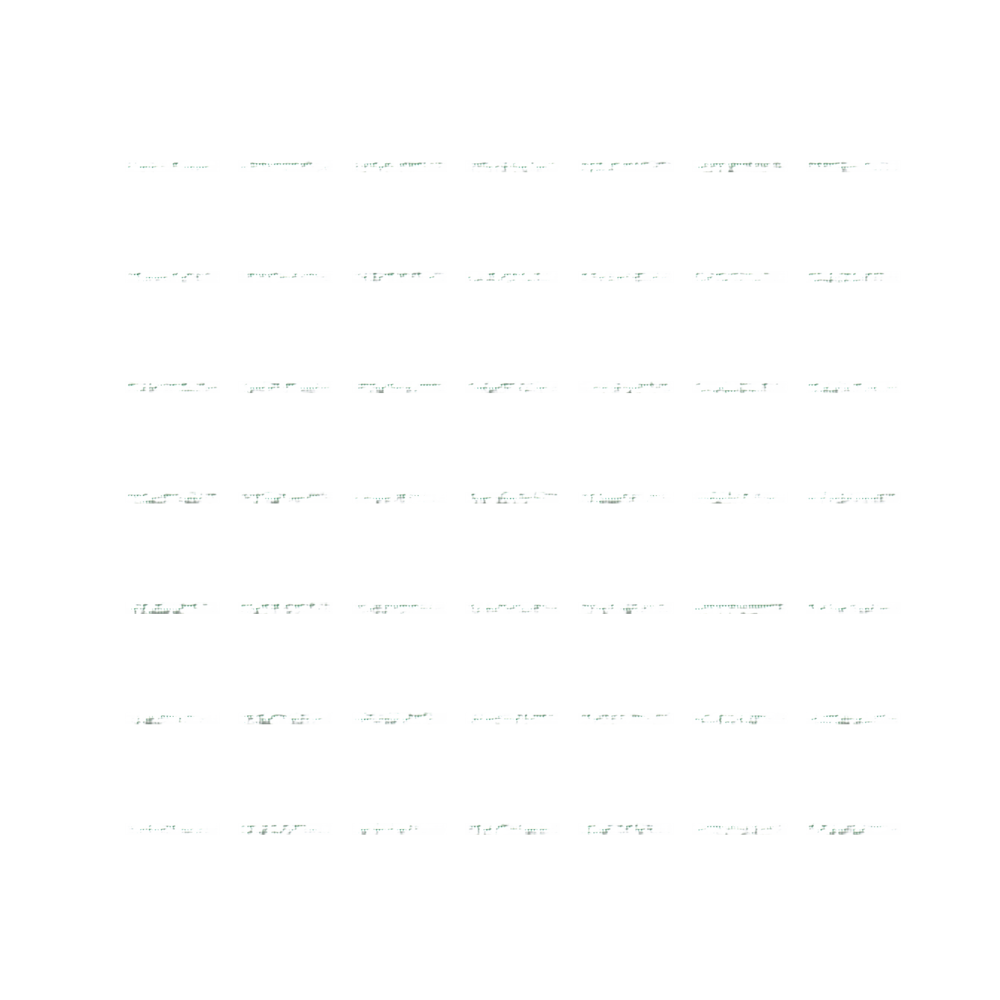

In [51]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

  0%|          | 0/500 [00:00<?, ?it/s]

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 0/36, d1=0.675, d2=0.695, g=0.692


/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>1, 0/36, d1=0.498, d2=0.697, g=0.691
>2, 0/36, d1=0.280, d2=0.702, g=0.689
>3, 0/36, d1=0.085, d2=0.710, g=0.684
>4, 0/36, d1=0.025, d2=0.728, g=0.673
>5, 0/36, d1=0.005, d2=0.761, g=0.660
>6, 0/36, d1=0.009, d2=0.798, g=0.653
>7, 0/36, d1=0.022, d2=0.816, g=0.662
>8, 0/36, d1=0.051, d2=0.829, g=0.684
>9, 0/36, d1=0.108, d2=0.880, g=0.673
>10, 0/36, d1=0.132, d2=1.015, g=0.677
>11, 0/36, d1=0.243, d2=1.034, g=0.627
>12, 0/36, d1=0.291, d2=1.028, g=0.666
>13, 0/36, d1=0.322, d2=0.826, g=0.781
>14, 0/36, d1=0.324, d2=0.720, g=0.957
>15, 0/36, d1=0.298, d2=0.613, g=1.145
>16, 0/36, d1=0.276, d2=0.620, g=1.245
>17, 0/36, d1=0.286, d2=0.609, g=1.155
>18, 0/36, d1=0.246, d2=0.603, g=1.138
>19, 0/36, d1=0.199, d2=0.589, g=1.081
>20, 0/36, d1=0.174, d2=0.633, g=0.987
>21, 0/36, d1=0.128, d2=0.670, g=0.918
>22, 0/36, d1=0.087, d2=0.669, g=0.875
>23, 0/36, d1=0.109, d2=0.720, g=0.853
>24, 0/36, d1=0.049, d2=0.655, g=0.917
>25, 0/36, d1=0.056, d2=0.582, g=1.025
>26, 0/36, d1=0.036, d2=0.500, g=1

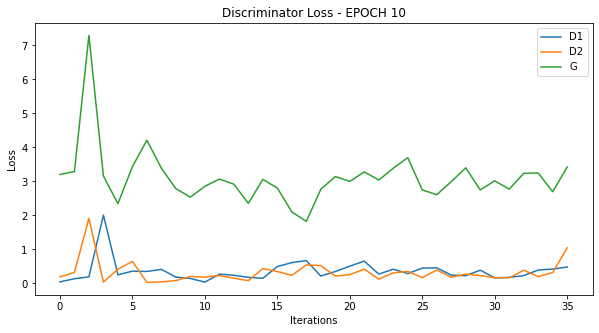

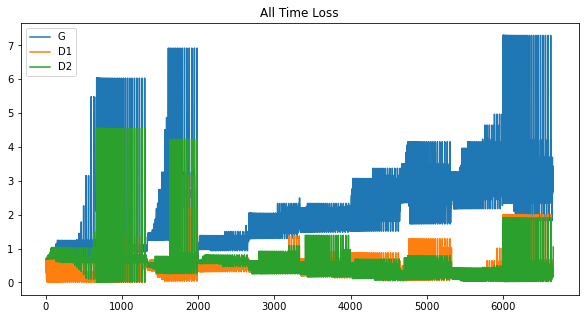

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 10/36, d1=0.937, d2=0.497, g=3.016
>1, 10/36, d1=0.602, d2=1.486, g=3.459
>2, 10/36, d1=1.073, d2=0.622, g=4.739
>3, 10/36, d1=1.763, d2=0.146, g=3.304
>4, 10/36, d1=0.617, d2=0.414, g=2.286
>5, 10/36, d1=0.301, d2=0.277, g=2.102
>6, 10/36, d1=0.386, d2=0.378, g=2.261
>7, 10/36, d1=0.208, d2=0.168, g=2.420
>8, 10/36, d1=0.439, d2=0.272, g=2.001
>9, 10/36, d1=0.172, d2=0.790, g=2.793
>10, 10/36, d1=0.525, d2=0.612, g=3.959
>11, 10/36, d1=0.687, d2=0.330, g=3.527
>12, 10/36, d1=0.785, d2=0.203, g=3.190
>13, 10/36, d1=0.528, d2=0.111, g=2.962
>14, 10/36, d1=0.313, d2=0.152, g=2.824
>15, 10/36, d1=0.146, d2=0.082, g=2.816
>16, 10/36, d1=0.205, d2=0.153, g=2.790
>17, 10/36, d1=0.168, d2=0.132, g=2.658
>18, 10/36, d1=0.076, d2=0.123, g=2.635
>19, 10/36, d1=0.053, d2=0.126, g=2.883
>20, 10/36, d1=0.125, d2=0.189, g=3.069
>21, 10/36, d1=0.710, d2=0.203, g=2.251
>22, 10/36, d1=0.171, d2=0.304, g=2.054
>23, 10/36, d1=0.388, d2=0.757, g=2.080
>24, 10/36, d1=0.332, d2=0.948, g=2.804
>25, 10/36

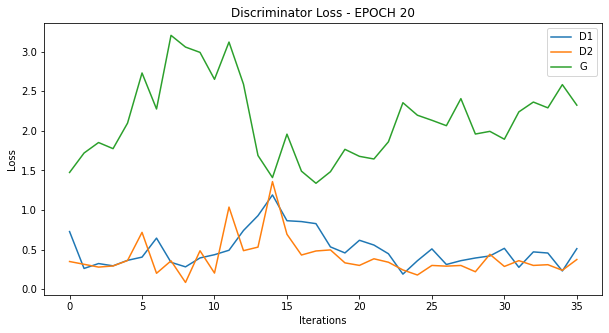

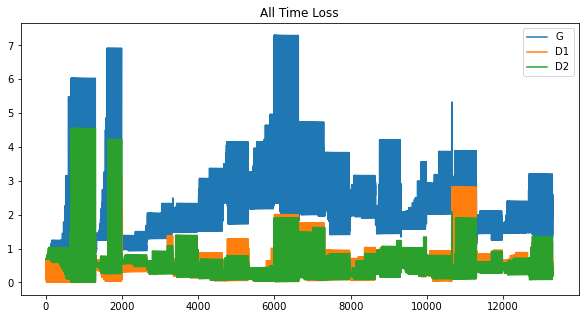

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 20/36, d1=0.368, d2=0.389, g=2.376
>1, 20/36, d1=0.444, d2=0.673, g=2.761
>2, 20/36, d1=0.674, d2=0.449, g=2.660
>3, 20/36, d1=0.606, d2=0.465, g=2.187
>4, 20/36, d1=0.416, d2=0.367, g=2.169
>5, 20/36, d1=0.602, d2=0.320, g=1.865
>6, 20/36, d1=0.376, d2=0.616, g=2.302
>7, 20/36, d1=0.816, d2=0.565, g=2.287
>8, 20/36, d1=0.596, d2=0.382, g=1.986
>9, 20/36, d1=0.539, d2=0.502, g=1.991
>10, 20/36, d1=0.534, d2=0.513, g=1.939
>11, 20/36, d1=0.631, d2=0.747, g=1.969
>12, 20/36, d1=0.676, d2=0.700, g=1.892
>13, 20/36, d1=0.972, d2=1.347, g=2.012
>14, 20/36, d1=0.837, d2=0.585, g=2.016
>15, 20/36, d1=0.964, d2=0.693, g=1.486
>16, 20/36, d1=0.686, d2=0.844, g=1.251
>17, 20/36, d1=0.836, d2=0.728, g=1.231
>18, 20/36, d1=0.893, d2=0.871, g=1.344
>19, 20/36, d1=0.609, d2=0.452, g=1.635
>20, 20/36, d1=0.682, d2=0.407, g=1.692
>21, 20/36, d1=0.851, d2=0.456, g=1.166
>22, 20/36, d1=0.324, d2=0.631, g=1.516
>23, 20/36, d1=0.308, d2=0.367, g=1.831
>24, 20/36, d1=0.412, d2=0.261, g=1.898
>25, 20/36

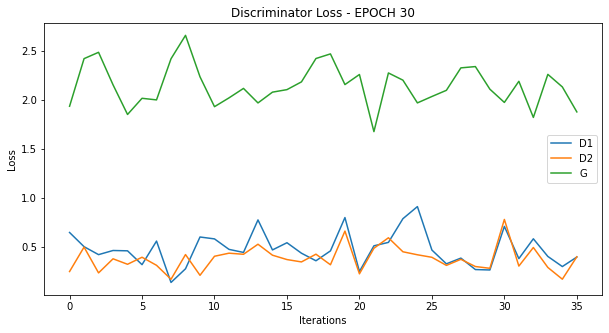

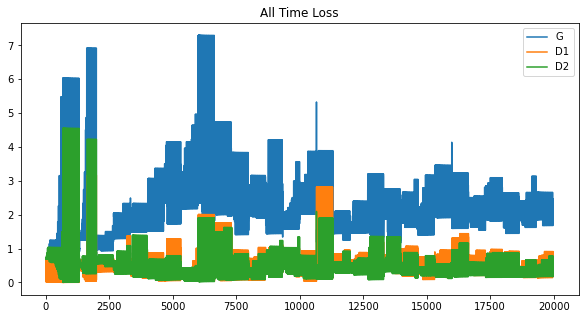

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 30/36, d1=0.341, d2=0.348, g=2.063
>1, 30/36, d1=0.405, d2=0.300, g=2.254
>2, 30/36, d1=0.358, d2=0.397, g=1.790
>3, 30/36, d1=0.378, d2=0.586, g=2.192
>4, 30/36, d1=0.282, d2=0.292, g=2.369
>5, 30/36, d1=0.631, d2=0.377, g=1.620
>6, 30/36, d1=0.410, d2=0.658, g=1.678
>7, 30/36, d1=0.431, d2=0.464, g=2.269
>8, 30/36, d1=1.030, d2=0.569, g=1.526
>9, 30/36, d1=0.537, d2=0.618, g=1.822
>10, 30/36, d1=0.582, d2=0.761, g=2.966
>11, 30/36, d1=1.055, d2=0.191, g=2.279
>12, 30/36, d1=0.546, d2=0.404, g=1.707
>13, 30/36, d1=0.551, d2=0.643, g=1.888
>14, 30/36, d1=0.497, d2=0.397, g=2.152
>15, 30/36, d1=0.892, d2=0.405, g=1.820
>16, 30/36, d1=0.685, d2=0.701, g=1.746
>17, 30/36, d1=0.368, d2=0.330, g=1.959
>18, 30/36, d1=0.431, d2=0.637, g=2.271
>19, 30/36, d1=0.750, d2=0.333, g=1.896
>20, 30/36, d1=0.593, d2=0.419, g=1.876
>21, 30/36, d1=0.262, d2=0.488, g=2.169
>22, 30/36, d1=0.805, d2=0.416, g=1.778
>23, 30/36, d1=0.382, d2=0.336, g=1.766
>24, 30/36, d1=0.186, d2=0.458, g=2.136
>25, 30/36

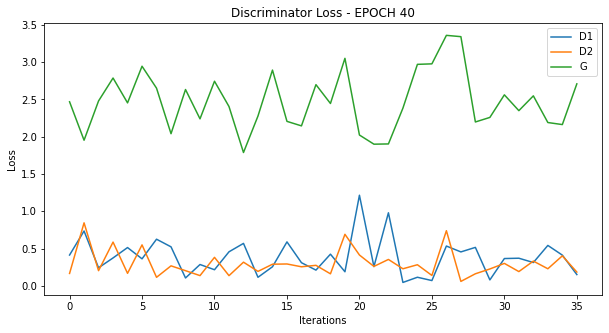

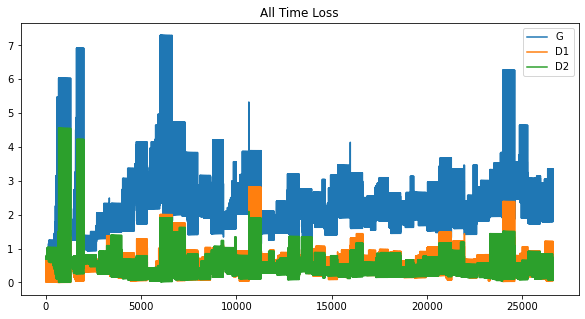

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 40/36, d1=0.608, d2=0.349, g=1.663
>1, 40/36, d1=0.214, d2=0.303, g=2.051
>2, 40/36, d1=0.446, d2=0.377, g=2.097
>3, 40/36, d1=0.309, d2=0.299, g=2.503
>4, 40/36, d1=0.374, d2=0.250, g=2.836
>5, 40/36, d1=0.390, d2=0.195, g=2.758
>6, 40/36, d1=0.227, d2=0.199, g=2.661
>7, 40/36, d1=0.345, d2=0.790, g=3.311
>8, 40/36, d1=0.657, d2=0.172, g=2.123
>9, 40/36, d1=0.499, d2=0.479, g=1.957
>10, 40/36, d1=0.421, d2=0.296, g=2.311
>11, 40/36, d1=0.311, d2=0.411, g=2.860
>12, 40/36, d1=0.621, d2=0.223, g=2.560
>13, 40/36, d1=0.412, d2=0.211, g=2.191
>14, 40/36, d1=0.323, d2=0.427, g=2.996
>15, 40/36, d1=0.496, d2=0.174, g=2.654
>16, 40/36, d1=0.352, d2=0.375, g=2.101
>17, 40/36, d1=0.267, d2=0.325, g=2.403
>18, 40/36, d1=0.255, d2=0.213, g=2.547
>19, 40/36, d1=0.441, d2=0.434, g=2.448
>20, 40/36, d1=0.381, d2=0.126, g=2.595
>21, 40/36, d1=0.167, d2=0.158, g=2.559
>22, 40/36, d1=0.103, d2=0.178, g=2.574
>23, 40/36, d1=0.220, d2=0.220, g=2.253
>24, 40/36, d1=0.156, d2=0.193, g=2.443
>25, 40/36

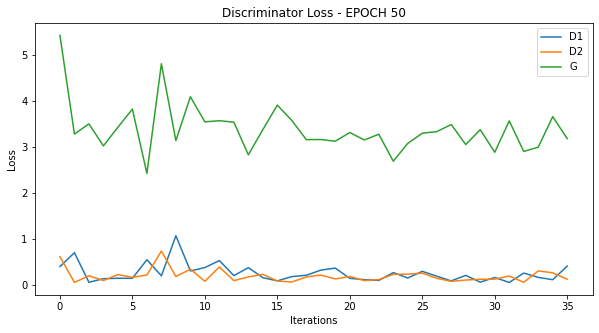

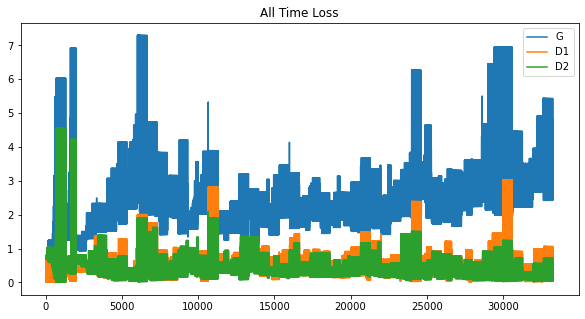

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 50/36, d1=0.070, d2=0.061, g=3.308
>1, 50/36, d1=0.231, d2=0.149, g=2.711
>2, 50/36, d1=0.286, d2=0.279, g=3.254
>3, 50/36, d1=0.195, d2=0.069, g=3.635
>4, 50/36, d1=0.188, d2=0.075, g=3.249
>5, 50/36, d1=0.025, d2=0.081, g=3.736
>6, 50/36, d1=0.015, d2=0.019, g=4.034
>7, 50/36, d1=0.028, d2=0.072, g=4.206
>8, 50/36, d1=0.115, d2=0.071, g=3.773
>9, 50/36, d1=0.044, d2=0.084, g=4.053
>10, 50/36, d1=0.158, d2=0.098, g=3.017
>11, 50/36, d1=0.659, d2=1.034, g=7.714
>12, 50/36, d1=3.470, d2=0.028, g=4.828
>13, 50/36, d1=0.471, d2=0.823, g=5.288
>14, 50/36, d1=0.826, d2=0.146, g=3.225
>15, 50/36, d1=0.332, d2=0.456, g=3.076
>16, 50/36, d1=0.463, d2=0.332, g=3.086
>17, 50/36, d1=0.173, d2=0.212, g=3.671
>18, 50/36, d1=0.366, d2=0.206, g=3.485
>19, 50/36, d1=0.229, d2=0.137, g=3.171
>20, 50/36, d1=0.299, d2=0.293, g=2.339
>21, 50/36, d1=0.079, d2=0.329, g=2.631
>22, 50/36, d1=0.264, d2=0.278, g=3.127
>23, 50/36, d1=0.219, d2=0.149, g=2.602
>24, 50/36, d1=0.222, d2=0.786, g=4.167
>25, 50/36

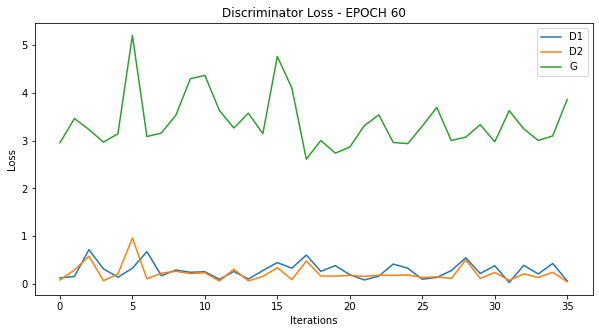

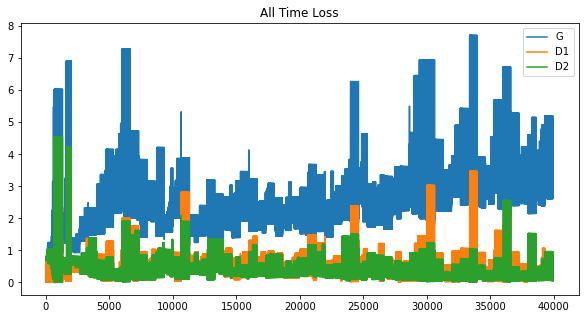

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 60/36, d1=0.023, d2=0.041, g=4.213
>1, 60/36, d1=0.228, d2=0.053, g=3.200
>2, 60/36, d1=0.156, d2=0.115, g=3.034
>3, 60/36, d1=0.164, d2=0.123, g=3.007
>4, 60/36, d1=0.126, d2=0.168, g=3.516
>5, 60/36, d1=0.304, d2=0.322, g=3.901
>6, 60/36, d1=0.366, d2=0.054, g=3.185
>7, 60/36, d1=0.077, d2=0.144, g=3.190
>8, 60/36, d1=0.161, d2=0.088, g=3.254
>9, 60/36, d1=0.358, d2=0.905, g=5.518
>10, 60/36, d1=2.094, d2=0.049, g=4.506
>11, 60/36, d1=0.992, d2=1.842, g=3.130
>12, 60/36, d1=0.284, d2=0.119, g=3.622
>13, 60/36, d1=0.696, d2=1.618, g=5.345
>14, 60/36, d1=2.680, d2=0.171, g=1.494
>15, 60/36, d1=0.491, d2=1.658, g=2.226
>16, 60/36, d1=0.447, d2=0.195, g=2.353
>17, 60/36, d1=0.455, d2=0.306, g=1.831
>18, 60/36, d1=0.223, d2=0.280, g=2.151
>19, 60/36, d1=0.178, d2=0.148, g=2.655
>20, 60/36, d1=0.258, d2=0.128, g=2.702
>21, 60/36, d1=0.716, d2=0.291, g=1.730
>22, 60/36, d1=0.182, d2=0.262, g=2.127
>23, 60/36, d1=0.167, d2=0.147, g=2.779
>24, 60/36, d1=0.116, d2=0.084, g=3.306
>25, 60/36

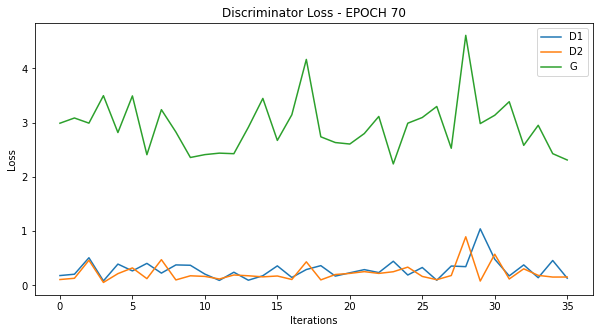

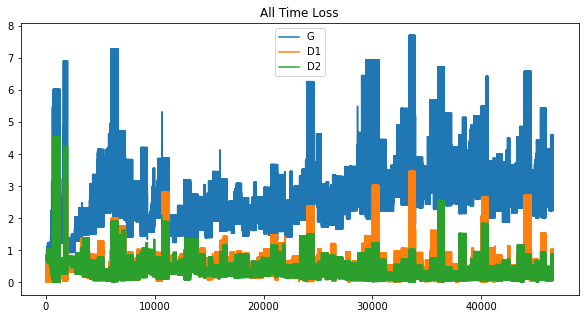

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 70/36, d1=0.255, d2=0.233, g=3.020
>1, 70/36, d1=0.163, d2=0.108, g=3.079
>2, 70/36, d1=0.130, d2=0.096, g=2.981
>3, 70/36, d1=0.127, d2=0.116, g=2.848
>4, 70/36, d1=0.279, d2=0.250, g=3.226
>5, 70/36, d1=0.160, d2=0.085, g=3.037
>6, 70/36, d1=0.374, d2=0.233, g=2.762
>7, 70/36, d1=0.474, d2=0.349, g=3.104
>8, 70/36, d1=0.499, d2=0.158, g=2.610
>9, 70/36, d1=0.228, d2=0.116, g=2.770
>10, 70/36, d1=0.167, d2=0.229, g=2.920
>11, 70/36, d1=0.321, d2=0.368, g=3.409
>12, 70/36, d1=0.329, d2=0.150, g=3.091
>13, 70/36, d1=0.750, d2=0.818, g=2.627
>14, 70/36, d1=0.244, d2=0.087, g=2.687
>15, 70/36, d1=0.575, d2=0.230, g=2.084
>16, 70/36, d1=0.057, d2=0.215, g=4.229
>17, 70/36, d1=0.217, d2=0.164, g=2.923
>18, 70/36, d1=0.152, d2=0.494, g=4.641
>19, 70/36, d1=0.356, d2=0.064, g=3.312
>20, 70/36, d1=0.818, d2=0.270, g=2.706
>21, 70/36, d1=0.108, d2=0.226, g=4.033
>22, 70/36, d1=0.805, d2=1.354, g=4.359
>23, 70/36, d1=1.371, d2=0.190, g=1.632
>24, 70/36, d1=0.373, d2=0.650, g=1.726
>25, 70/36

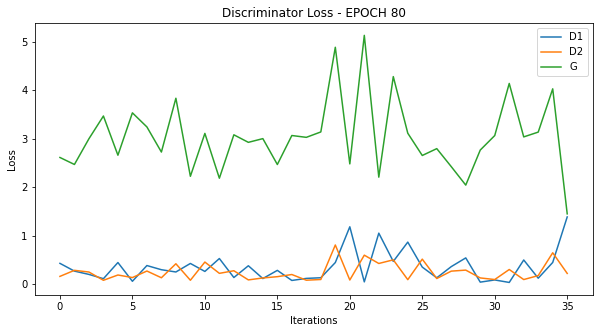

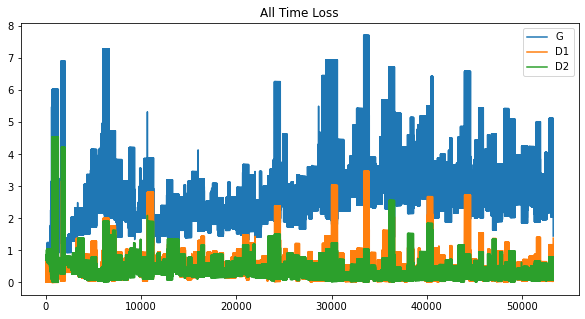

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 80/36, d1=0.129, d2=0.499, g=2.002
>1, 80/36, d1=0.445, d2=0.473, g=3.317
>2, 80/36, d1=0.635, d2=0.089, g=2.917
>3, 80/36, d1=0.310, d2=0.165, g=2.452
>4, 80/36, d1=0.112, d2=0.218, g=3.336
>5, 80/36, d1=0.232, d2=0.102, g=2.934
>6, 80/36, d1=0.114, d2=0.150, g=2.787
>7, 80/36, d1=0.263, d2=0.277, g=3.034
>8, 80/36, d1=0.514, d2=0.261, g=2.625
>9, 80/36, d1=0.166, d2=0.163, g=2.664
>10, 80/36, d1=0.494, d2=0.361, g=2.497
>11, 80/36, d1=0.350, d2=0.229, g=2.390
>12, 80/36, d1=0.133, d2=0.147, g=2.701
>13, 80/36, d1=0.117, d2=0.148, g=3.392
>14, 80/36, d1=0.501, d2=0.359, g=2.951
>15, 80/36, d1=0.306, d2=0.160, g=2.660
>16, 80/36, d1=0.231, d2=0.323, g=2.792
>17, 80/36, d1=0.312, d2=0.198, g=3.416
>18, 80/36, d1=0.176, d2=0.125, g=3.367
>19, 80/36, d1=0.430, d2=0.160, g=2.629
>20, 80/36, d1=0.238, d2=0.195, g=2.927
>21, 80/36, d1=0.409, d2=0.302, g=2.653
>22, 80/36, d1=0.145, d2=0.101, g=2.624
>23, 80/36, d1=0.225, d2=0.404, g=3.275
>24, 80/36, d1=0.245, d2=0.064, g=3.099
>25, 80/36

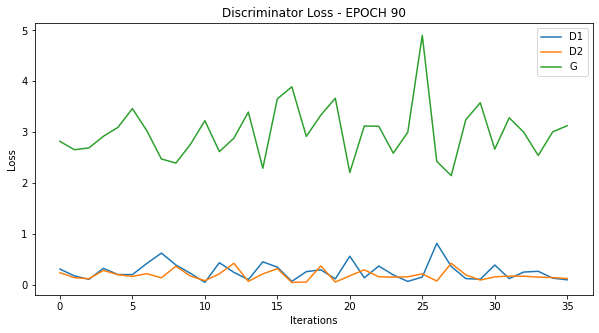

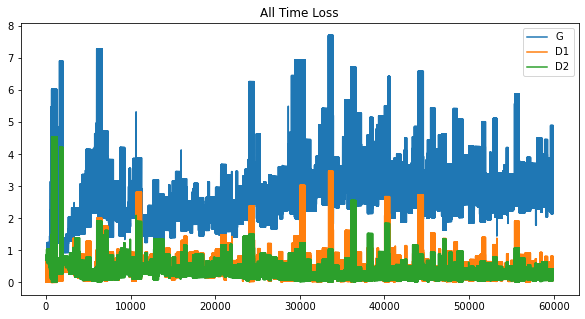

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 90/36, d1=0.149, d2=0.098, g=2.974
>1, 90/36, d1=0.184, d2=0.297, g=3.454
>2, 90/36, d1=0.231, d2=0.072, g=3.202
>3, 90/36, d1=0.303, d2=0.104, g=2.223
>4, 90/36, d1=0.021, d2=0.321, g=3.791
>5, 90/36, d1=0.316, d2=0.042, g=3.599
>6, 90/36, d1=0.412, d2=0.121, g=2.631
>7, 90/36, d1=0.308, d2=0.221, g=2.388
>8, 90/36, d1=0.148, d2=0.238, g=3.455
>9, 90/36, d1=0.210, d2=0.065, g=2.894
>10, 90/36, d1=0.487, d2=0.657, g=2.692
>11, 90/36, d1=0.219, d2=0.117, g=2.651
>12, 90/36, d1=0.380, d2=0.167, g=2.243
>13, 90/36, d1=0.130, d2=0.200, g=2.625
>14, 90/36, d1=0.058, d2=0.183, g=3.921
>15, 90/36, d1=0.428, d2=0.163, g=3.503
>16, 90/36, d1=0.163, d2=0.147, g=3.525
>17, 90/36, d1=0.457, d2=0.215, g=3.020
>18, 90/36, d1=0.175, d2=0.479, g=6.374
>19, 90/36, d1=2.260, d2=0.046, g=4.538
>20, 90/36, d1=0.737, d2=1.121, g=2.531
>21, 90/36, d1=0.035, d2=0.050, g=3.306
>22, 90/36, d1=0.916, d2=0.702, g=2.173
>23, 90/36, d1=0.571, d2=0.186, g=2.545
>24, 90/36, d1=0.585, d2=0.433, g=2.813
>25, 90/36

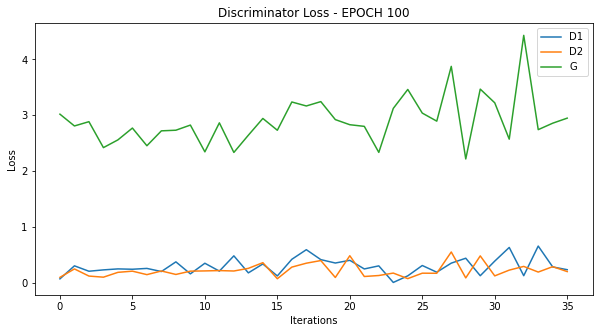

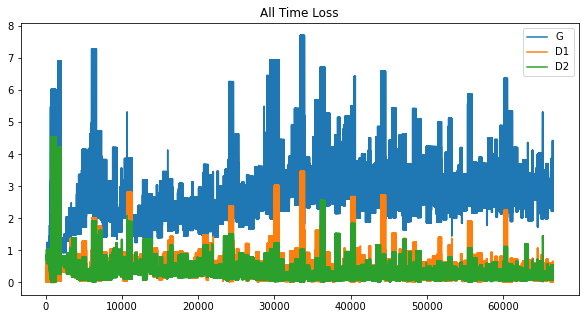

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 100/36, d1=0.356, d2=0.364, g=2.893
>1, 100/36, d1=0.151, d2=0.182, g=3.517
>2, 100/36, d1=0.784, d2=0.287, g=2.473
>3, 100/36, d1=0.229, d2=0.205, g=2.572
>4, 100/36, d1=0.187, d2=0.189, g=2.453
>5, 100/36, d1=0.191, d2=0.163, g=2.872
>6, 100/36, d1=0.249, d2=0.243, g=2.912
>7, 100/36, d1=0.275, d2=0.169, g=2.633
>8, 100/36, d1=0.068, d2=0.282, g=4.752
>9, 100/36, d1=1.023, d2=0.413, g=4.956
>10, 100/36, d1=0.764, d2=1.460, g=3.505
>11, 100/36, d1=0.814, d2=0.297, g=2.483
>12, 100/36, d1=0.949, d2=0.715, g=2.411
>13, 100/36, d1=0.453, d2=0.283, g=3.360
>14, 100/36, d1=0.392, d2=0.224, g=3.243
>15, 100/36, d1=0.480, d2=0.155, g=3.108
>16, 100/36, d1=0.135, d2=0.180, g=3.378
>17, 100/36, d1=0.327, d2=0.995, g=3.628
>18, 100/36, d1=1.089, d2=0.348, g=1.943
>19, 100/36, d1=0.429, d2=0.276, g=2.488
>20, 100/36, d1=0.169, d2=0.419, g=3.300
>21, 100/36, d1=0.310, d2=0.466, g=3.511
>22, 100/36, d1=0.180, d2=0.049, g=3.662
>23, 100/36, d1=0.123, d2=0.108, g=3.448
>24, 100/36, d1=0.242, d2=

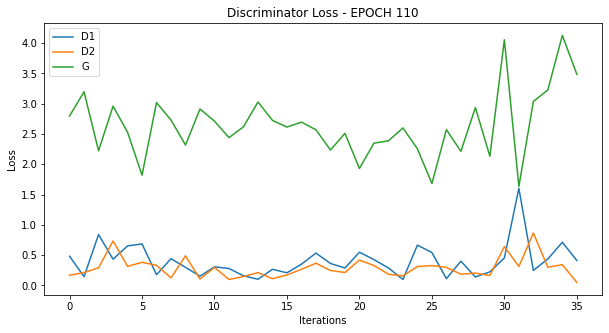

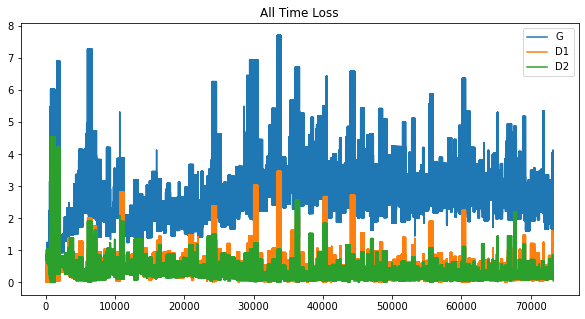

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 110/36, d1=0.101, d2=0.100, g=3.078
>1, 110/36, d1=0.151, d2=0.193, g=2.994
>2, 110/36, d1=0.147, d2=0.242, g=3.113
>3, 110/36, d1=0.442, d2=0.440, g=3.382
>4, 110/36, d1=0.491, d2=0.100, g=3.131
>5, 110/36, d1=0.632, d2=0.243, g=2.135
>6, 110/36, d1=0.184, d2=0.326, g=2.253
>7, 110/36, d1=0.243, d2=0.426, g=3.105
>8, 110/36, d1=0.100, d2=0.085, g=3.642
>9, 110/36, d1=0.650, d2=0.233, g=2.572
>10, 110/36, d1=0.435, d2=0.305, g=2.743
>11, 110/36, d1=0.300, d2=0.360, g=3.039
>12, 110/36, d1=0.505, d2=0.121, g=2.682
>13, 110/36, d1=0.310, d2=0.334, g=2.121
>14, 110/36, d1=0.163, d2=0.316, g=2.967
>15, 110/36, d1=0.364, d2=0.118, g=2.582
>16, 110/36, d1=0.247, d2=0.201, g=2.378
>17, 110/36, d1=0.147, d2=0.205, g=3.120
>18, 110/36, d1=0.246, d2=0.098, g=2.713
>19, 110/36, d1=0.486, d2=0.193, g=2.039
>20, 110/36, d1=0.171, d2=0.327, g=2.687
>21, 110/36, d1=0.154, d2=0.111, g=3.188
>22, 110/36, d1=0.411, d2=0.146, g=2.263
>23, 110/36, d1=0.152, d2=0.239, g=2.680
>24, 110/36, d1=0.318, d2=

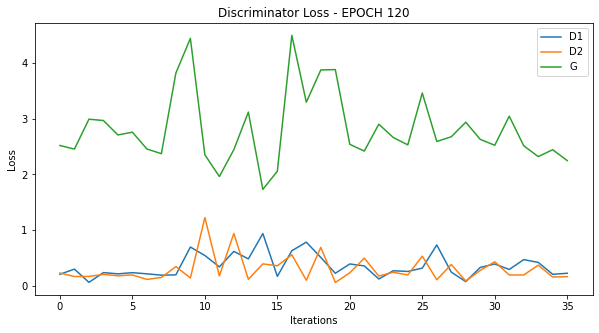

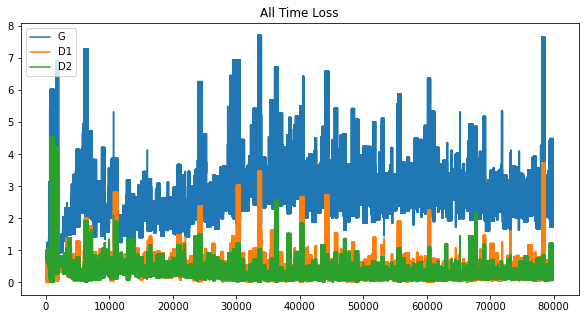

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 120/36, d1=0.033, d2=0.137, g=2.851
>1, 120/36, d1=0.480, d2=0.506, g=2.962
>2, 120/36, d1=0.241, d2=0.114, g=3.226
>3, 120/36, d1=0.489, d2=0.204, g=2.178
>4, 120/36, d1=0.102, d2=0.191, g=2.713
>5, 120/36, d1=0.460, d2=0.312, g=2.795
>6, 120/36, d1=0.284, d2=0.118, g=2.774
>7, 120/36, d1=0.185, d2=0.291, g=3.300
>8, 120/36, d1=0.332, d2=0.097, g=3.184
>9, 120/36, d1=0.246, d2=0.228, g=2.663
>10, 120/36, d1=0.268, d2=0.297, g=2.595
>11, 120/36, d1=0.165, d2=0.093, g=2.875
>12, 120/36, d1=0.481, d2=0.420, g=2.952
>13, 120/36, d1=0.549, d2=0.468, g=2.564
>14, 120/36, d1=0.470, d2=0.247, g=2.274
>15, 120/36, d1=0.131, d2=0.174, g=2.839
>16, 120/36, d1=0.520, d2=0.185, g=2.364
>17, 120/36, d1=0.249, d2=0.206, g=2.015
>18, 120/36, d1=0.122, d2=0.291, g=2.739
>19, 120/36, d1=0.599, d2=0.162, g=2.259
>20, 120/36, d1=0.235, d2=0.332, g=2.482
>21, 120/36, d1=0.252, d2=0.208, g=2.595
>22, 120/36, d1=0.454, d2=0.250, g=2.313
>23, 120/36, d1=0.470, d2=0.429, g=2.184
>24, 120/36, d1=0.310, d2=

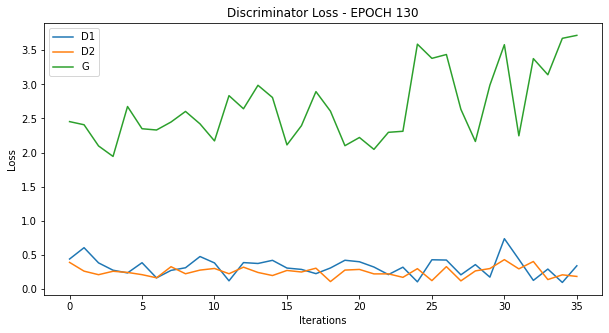

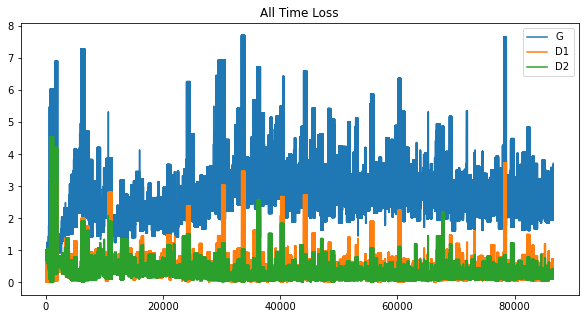

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 130/36, d1=0.344, d2=0.137, g=3.087
>1, 130/36, d1=0.218, d2=0.276, g=2.751
>2, 130/36, d1=0.530, d2=0.201, g=2.308
>3, 130/36, d1=0.171, d2=0.319, g=2.387
>4, 130/36, d1=0.530, d2=0.185, g=2.242
>5, 130/36, d1=0.183, d2=0.345, g=2.816
>6, 130/36, d1=0.504, d2=0.169, g=2.760
>7, 130/36, d1=0.757, d2=0.474, g=2.073
>8, 130/36, d1=0.095, d2=0.188, g=2.933
>9, 130/36, d1=0.605, d2=0.244, g=2.191
>10, 130/36, d1=0.161, d2=0.331, g=3.370
>11, 130/36, d1=0.817, d2=0.320, g=2.556
>12, 130/36, d1=0.198, d2=0.171, g=3.213
>13, 130/36, d1=0.453, d2=0.409, g=2.312
>14, 130/36, d1=0.805, d2=0.763, g=2.761
>15, 130/36, d1=0.432, d2=0.164, g=2.457
>16, 130/36, d1=0.107, d2=0.285, g=2.709
>17, 130/36, d1=0.264, d2=0.386, g=3.195
>18, 130/36, d1=0.366, d2=0.181, g=2.200
>19, 130/36, d1=0.213, d2=0.200, g=2.104
>20, 130/36, d1=0.077, d2=0.140, g=2.620
>21, 130/36, d1=0.159, d2=0.157, g=2.756
>22, 130/36, d1=0.443, d2=0.271, g=2.537
>23, 130/36, d1=0.364, d2=0.229, g=2.436
>24, 130/36, d1=0.325, d2=

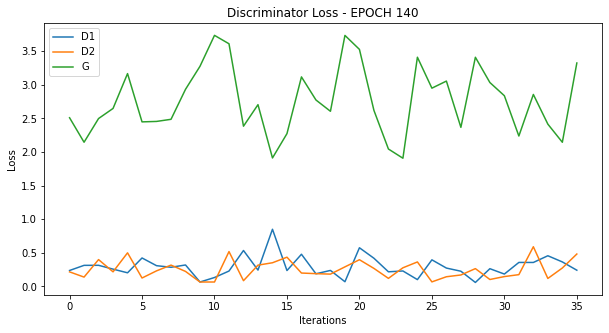

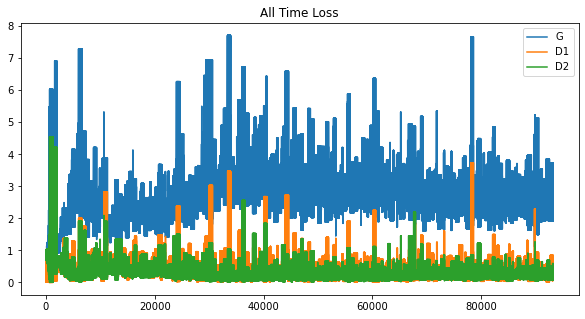

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 140/36, d1=0.410, d2=0.106, g=2.801
>1, 140/36, d1=0.153, d2=0.225, g=2.986
>2, 140/36, d1=0.412, d2=0.229, g=2.716
>3, 140/36, d1=0.143, d2=0.164, g=2.690
>4, 140/36, d1=0.291, d2=0.344, g=2.556
>5, 140/36, d1=0.118, d2=0.148, g=3.174
>6, 140/36, d1=0.555, d2=0.649, g=3.189
>7, 140/36, d1=0.469, d2=0.141, g=2.646
>8, 140/36, d1=0.739, d2=0.351, g=1.896
>9, 140/36, d1=0.173, d2=0.186, g=2.159
>10, 140/36, d1=0.399, d2=0.323, g=2.585
>11, 140/36, d1=0.311, d2=0.107, g=2.369
>12, 140/36, d1=0.358, d2=0.602, g=3.091
>13, 140/36, d1=0.262, d2=0.080, g=3.196
>14, 140/36, d1=0.447, d2=0.341, g=2.885
>15, 140/36, d1=0.270, d2=0.098, g=2.367
>16, 140/36, d1=0.318, d2=0.192, g=2.020
>17, 140/36, d1=0.162, d2=0.491, g=2.792
>18, 140/36, d1=0.210, d2=0.108, g=2.891
>19, 140/36, d1=0.336, d2=0.244, g=2.552
>20, 140/36, d1=0.449, d2=0.206, g=2.033
>21, 140/36, d1=0.343, d2=0.427, g=2.481
>22, 140/36, d1=0.202, d2=0.157, g=2.522
>23, 140/36, d1=0.537, d2=0.235, g=1.833
>24, 140/36, d1=0.113, d2=

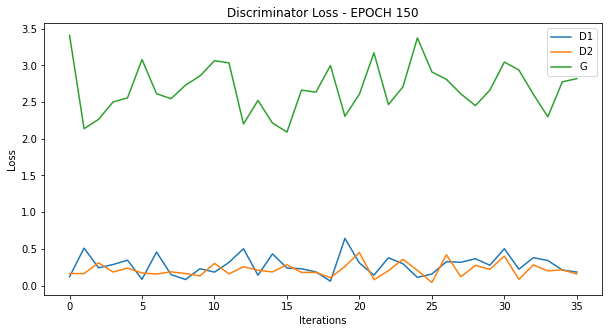

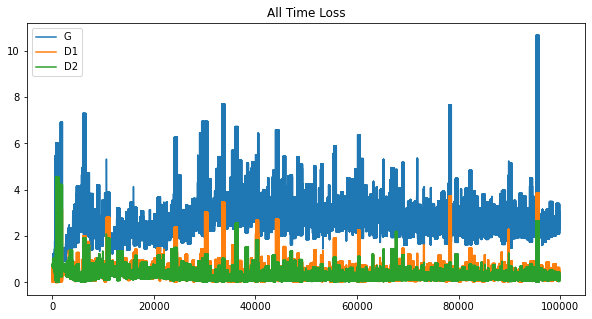

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 150/36, d1=0.226, d2=0.154, g=2.631
>1, 150/36, d1=0.378, d2=0.151, g=2.288
>2, 150/36, d1=0.236, d2=0.290, g=2.106
>3, 150/36, d1=0.328, d2=0.343, g=2.664
>4, 150/36, d1=0.185, d2=0.113, g=3.058
>5, 150/36, d1=0.581, d2=0.654, g=3.403
>6, 150/36, d1=0.540, d2=0.109, g=2.352
>7, 150/36, d1=0.327, d2=0.220, g=2.583
>8, 150/36, d1=0.198, d2=0.213, g=2.930
>9, 150/36, d1=0.376, d2=0.109, g=2.346
>10, 150/36, d1=0.247, d2=0.301, g=2.697
>11, 150/36, d1=0.236, d2=0.179, g=2.634
>12, 150/36, d1=0.164, d2=0.110, g=2.561
>13, 150/36, d1=0.143, d2=0.179, g=2.972
>14, 150/36, d1=0.185, d2=0.108, g=2.740
>15, 150/36, d1=0.089, d2=0.149, g=3.041
>16, 150/36, d1=0.297, d2=0.142, g=2.201
>17, 150/36, d1=0.447, d2=0.332, g=3.193
>18, 150/36, d1=0.487, d2=0.227, g=2.087
>19, 150/36, d1=0.183, d2=0.188, g=2.258
>20, 150/36, d1=0.274, d2=0.295, g=2.439
>21, 150/36, d1=0.303, d2=0.128, g=2.631
>22, 150/36, d1=0.223, d2=0.177, g=2.202
>23, 150/36, d1=0.092, d2=0.227, g=3.159
>24, 150/36, d1=0.156, d2=

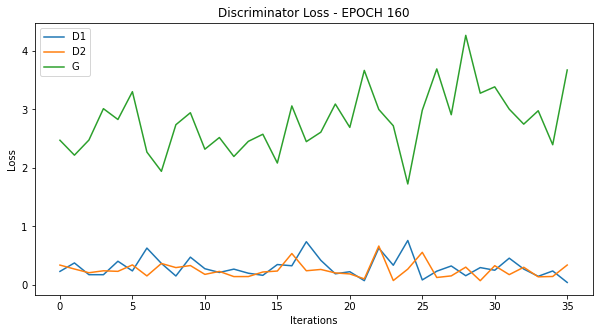

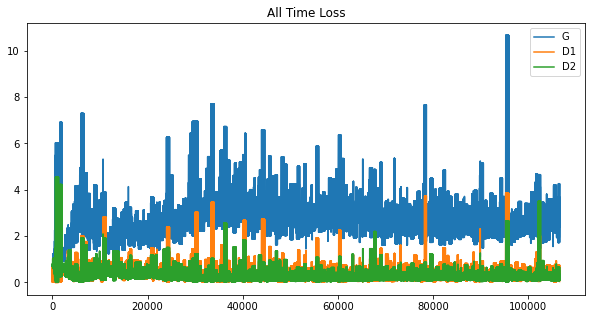

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 160/36, d1=0.307, d2=0.069, g=2.914
>1, 160/36, d1=0.437, d2=0.186, g=1.910
>2, 160/36, d1=0.115, d2=0.294, g=3.202
>3, 160/36, d1=0.323, d2=0.138, g=2.715
>4, 160/36, d1=0.152, d2=0.206, g=3.304
>5, 160/36, d1=0.363, d2=0.304, g=2.526
>6, 160/36, d1=0.549, d2=0.321, g=2.704
>7, 160/36, d1=0.249, d2=0.250, g=2.784
>8, 160/36, d1=0.173, d2=0.100, g=2.254
>9, 160/36, d1=0.024, d2=0.231, g=3.441
>10, 160/36, d1=0.241, d2=0.123, g=3.302
>11, 160/36, d1=0.222, d2=0.113, g=2.999
>12, 160/36, d1=0.419, d2=0.150, g=2.985
>13, 160/36, d1=0.260, d2=0.218, g=2.375
>14, 160/36, d1=0.254, d2=0.326, g=2.898
>15, 160/36, d1=0.324, d2=0.110, g=3.207
>16, 160/36, d1=0.410, d2=0.164, g=2.392
>17, 160/36, d1=0.149, d2=0.203, g=2.687
>18, 160/36, d1=0.249, d2=0.267, g=2.632
>19, 160/36, d1=0.337, d2=0.193, g=2.545
>20, 160/36, d1=0.272, d2=0.352, g=2.875
>21, 160/36, d1=0.265, d2=0.138, g=2.691
>22, 160/36, d1=0.291, d2=0.243, g=2.150
>23, 160/36, d1=0.106, d2=0.198, g=2.810
>24, 160/36, d1=0.290, d2=

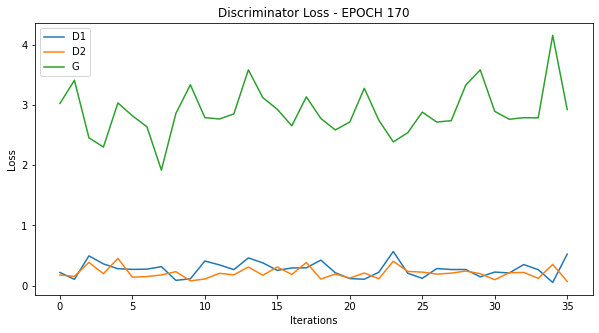

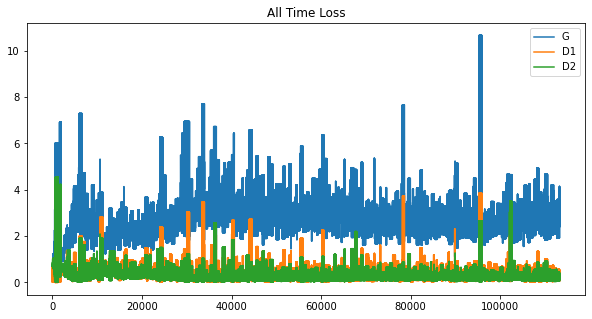

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 170/36, d1=0.266, d2=0.203, g=2.575
>1, 170/36, d1=0.549, d2=0.224, g=2.117
>2, 170/36, d1=0.080, d2=0.201, g=3.540
>3, 170/36, d1=0.430, d2=0.087, g=3.267
>4, 170/36, d1=0.019, d2=0.286, g=3.508
>5, 170/36, d1=0.442, d2=0.167, g=2.448
>6, 170/36, d1=0.095, d2=0.345, g=4.039
>7, 170/36, d1=0.513, d2=0.115, g=3.059
>8, 170/36, d1=0.313, d2=0.408, g=3.070
>9, 170/36, d1=0.261, d2=0.157, g=2.821
>10, 170/36, d1=0.469, d2=0.280, g=2.366
>11, 170/36, d1=0.207, d2=0.303, g=2.890
>12, 170/36, d1=0.582, d2=0.118, g=2.184
>13, 170/36, d1=0.313, d2=0.477, g=1.901
>14, 170/36, d1=0.071, d2=0.234, g=2.958
>15, 170/36, d1=0.247, d2=0.111, g=2.980
>16, 170/36, d1=0.357, d2=0.163, g=2.800
>17, 170/36, d1=0.084, d2=0.220, g=3.492
>18, 170/36, d1=0.547, d2=0.228, g=3.234
>19, 170/36, d1=0.104, d2=0.061, g=3.704
>20, 170/36, d1=0.483, d2=0.403, g=3.067
>21, 170/36, d1=0.258, d2=0.261, g=3.023
>22, 170/36, d1=0.358, d2=0.146, g=2.397
>23, 170/36, d1=0.229, d2=0.284, g=3.168
>24, 170/36, d1=0.305, d2=

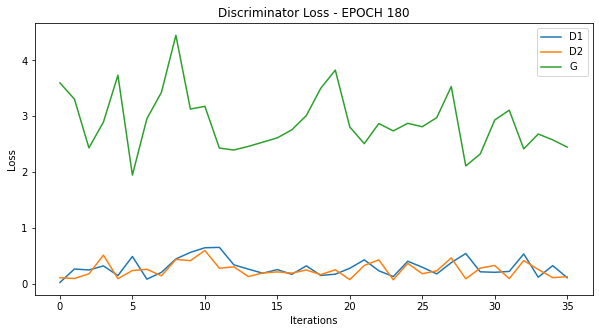

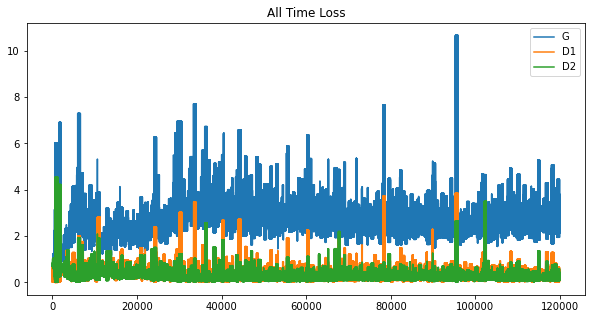

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 180/36, d1=0.096, d2=0.108, g=2.956
>1, 180/36, d1=0.558, d2=0.418, g=2.999
>2, 180/36, d1=0.192, d2=0.056, g=3.217
>3, 180/36, d1=0.344, d2=0.344, g=3.282
>4, 180/36, d1=0.558, d2=0.575, g=3.011
>5, 180/36, d1=0.307, d2=0.159, g=2.870
>6, 180/36, d1=0.170, d2=0.134, g=2.571
>7, 180/36, d1=0.263, d2=0.194, g=2.410
>8, 180/36, d1=0.196, d2=0.296, g=2.929
>9, 180/36, d1=0.361, d2=0.273, g=2.771
>10, 180/36, d1=0.034, d2=0.138, g=3.459
>11, 180/36, d1=0.194, d2=0.057, g=3.126
>12, 180/36, d1=0.326, d2=0.197, g=2.823
>13, 180/36, d1=0.462, d2=0.502, g=3.054
>14, 180/36, d1=0.207, d2=0.139, g=2.650
>15, 180/36, d1=0.210, d2=0.176, g=3.223
>16, 180/36, d1=0.380, d2=0.174, g=2.893
>17, 180/36, d1=0.445, d2=0.258, g=2.789
>18, 180/36, d1=0.124, d2=0.177, g=2.884
>19, 180/36, d1=0.305, d2=0.219, g=2.876
>20, 180/36, d1=0.120, d2=0.186, g=3.579
>21, 180/36, d1=0.199, d2=0.089, g=2.795
>22, 180/36, d1=0.268, d2=0.147, g=2.409
>23, 180/36, d1=0.240, d2=0.761, g=3.940
>24, 180/36, d1=1.032, d2=

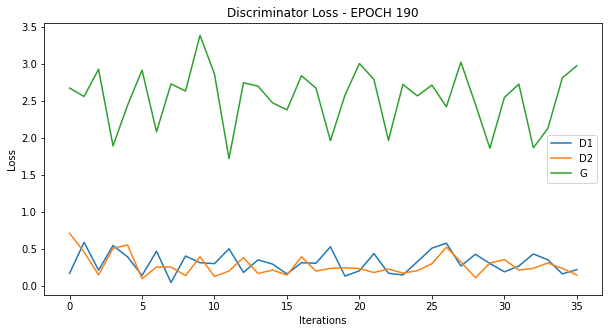

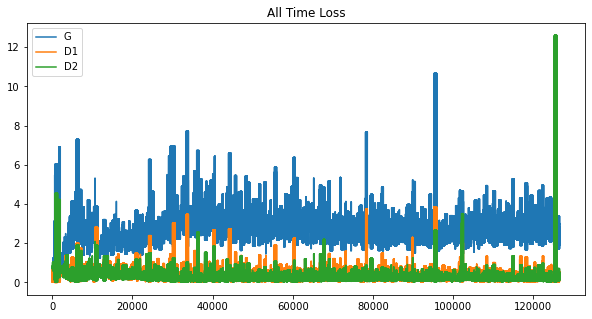

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 190/36, d1=0.370, d2=0.273, g=2.900
>1, 190/36, d1=0.174, d2=0.137, g=2.781
>2, 190/36, d1=0.153, d2=0.157, g=2.935
>3, 190/36, d1=0.278, d2=0.227, g=3.654
>4, 190/36, d1=0.364, d2=0.406, g=2.966
>5, 190/36, d1=0.435, d2=0.131, g=2.396
>6, 190/36, d1=0.218, d2=0.571, g=2.472
>7, 190/36, d1=0.477, d2=0.176, g=2.436
>8, 190/36, d1=0.348, d2=0.282, g=2.786
>9, 190/36, d1=0.163, d2=0.159, g=3.031
>10, 190/36, d1=0.447, d2=0.207, g=2.129
>11, 190/36, d1=0.205, d2=0.330, g=2.824
>12, 190/36, d1=0.236, d2=0.200, g=3.253
>13, 190/36, d1=0.478, d2=0.185, g=2.049
>14, 190/36, d1=0.251, d2=0.250, g=2.258
>15, 190/36, d1=0.127, d2=0.190, g=2.447
>16, 190/36, d1=0.168, d2=0.262, g=3.132
>17, 190/36, d1=0.626, d2=0.173, g=2.687
>18, 190/36, d1=0.271, d2=0.223, g=2.671
>19, 190/36, d1=0.436, d2=0.344, g=2.447
>20, 190/36, d1=0.230, d2=0.226, g=3.386
>21, 190/36, d1=0.512, d2=0.109, g=2.345
>22, 190/36, d1=0.296, d2=0.208, g=2.415
>23, 190/36, d1=0.067, d2=0.127, g=2.564
>24, 190/36, d1=0.385, d2=

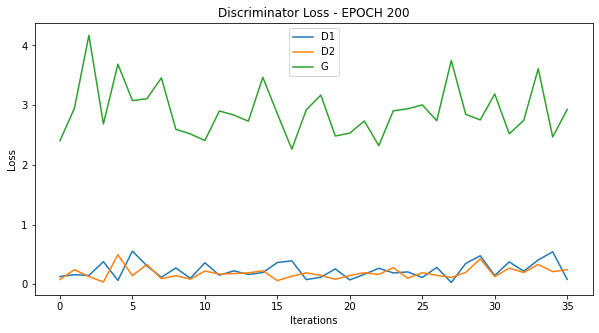

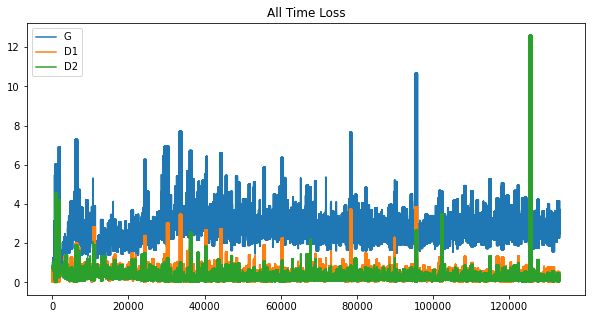

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 200/36, d1=0.488, d2=0.154, g=2.729
>1, 200/36, d1=0.241, d2=0.137, g=2.265
>2, 200/36, d1=0.126, d2=0.308, g=2.444
>3, 200/36, d1=0.371, d2=0.214, g=2.798
>4, 200/36, d1=0.311, d2=0.132, g=2.529
>5, 200/36, d1=0.112, d2=0.240, g=3.178
>6, 200/36, d1=0.144, d2=0.092, g=3.285
>7, 200/36, d1=0.362, d2=0.292, g=2.693
>8, 200/36, d1=0.033, d2=0.106, g=2.946
>9, 200/36, d1=0.181, d2=0.126, g=2.574
>10, 200/36, d1=0.088, d2=0.232, g=3.490
>11, 200/36, d1=0.367, d2=0.127, g=3.251
>12, 200/36, d1=0.397, d2=0.149, g=2.583
>13, 200/36, d1=0.089, d2=0.073, g=3.445
>14, 200/36, d1=0.176, d2=0.371, g=4.056
>15, 200/36, d1=0.307, d2=0.222, g=3.163
>16, 200/36, d1=0.130, d2=0.161, g=3.615
>17, 200/36, d1=0.383, d2=0.358, g=3.442
>18, 200/36, d1=0.145, d2=0.043, g=3.344
>19, 200/36, d1=0.667, d2=0.374, g=2.788
>20, 200/36, d1=0.016, d2=0.220, g=3.551
>21, 200/36, d1=0.294, d2=0.145, g=3.654
>22, 200/36, d1=0.578, d2=0.182, g=2.687
>23, 200/36, d1=0.396, d2=0.170, g=3.150
>24, 200/36, d1=0.200, d2=

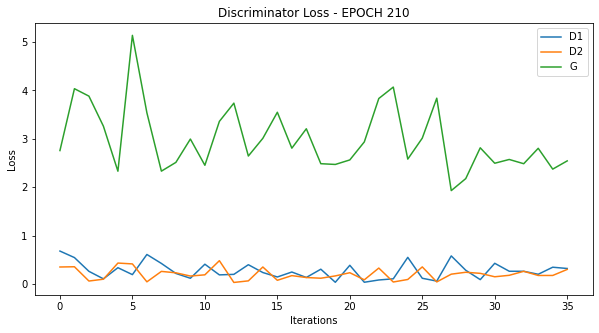

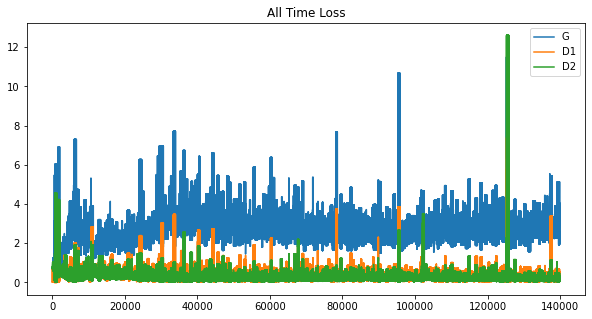

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 210/36, d1=0.219, d2=0.137, g=2.575
>1, 210/36, d1=0.113, d2=0.094, g=3.061
>2, 210/36, d1=0.053, d2=0.116, g=3.184
>3, 210/36, d1=0.382, d2=0.128, g=2.225
>4, 210/36, d1=0.040, d2=0.135, g=3.044
>5, 210/36, d1=0.274, d2=0.118, g=2.276
>6, 210/36, d1=0.050, d2=0.178, g=3.070
>7, 210/36, d1=0.176, d2=0.165, g=3.914
>8, 210/36, d1=0.681, d2=0.127, g=2.246
>9, 210/36, d1=0.165, d2=0.292, g=2.536
>10, 210/36, d1=0.219, d2=0.172, g=2.561
>11, 210/36, d1=0.262, d2=0.425, g=3.391
>12, 210/36, d1=0.286, d2=0.091, g=3.521
>13, 210/36, d1=0.442, d2=0.145, g=2.325
>14, 210/36, d1=0.104, d2=0.376, g=3.066
>15, 210/36, d1=0.512, d2=0.122, g=2.584
>16, 210/36, d1=0.311, d2=0.335, g=2.761
>17, 210/36, d1=0.173, d2=0.098, g=3.314
>18, 210/36, d1=0.203, d2=0.164, g=2.463
>19, 210/36, d1=0.064, d2=0.209, g=2.983
>20, 210/36, d1=0.241, d2=0.114, g=3.157
>21, 210/36, d1=0.209, d2=0.144, g=2.544
>22, 210/36, d1=0.088, d2=0.151, g=2.984
>23, 210/36, d1=0.065, d2=0.090, g=3.383
>24, 210/36, d1=0.654, d2=

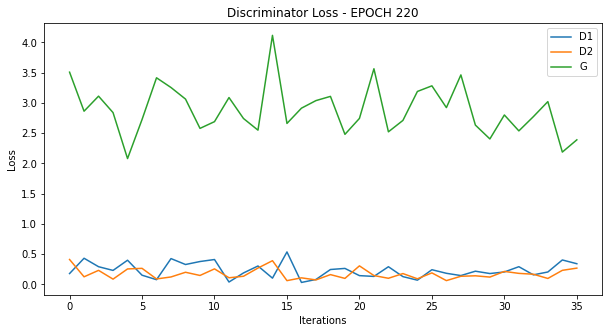

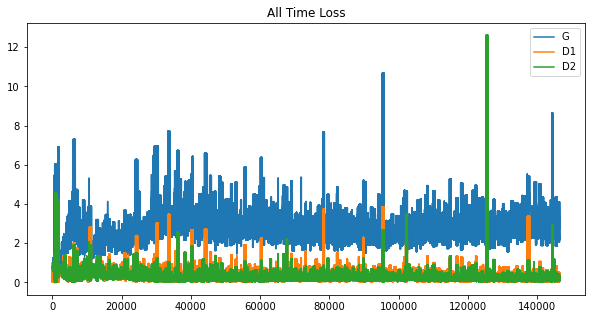

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 220/36, d1=0.206, d2=0.114, g=2.477
>1, 220/36, d1=0.144, d2=0.322, g=2.844
>2, 220/36, d1=0.404, d2=0.237, g=2.863
>3, 220/36, d1=0.135, d2=0.117, g=2.728
>4, 220/36, d1=0.416, d2=0.332, g=3.353
>5, 220/36, d1=0.440, d2=0.089, g=2.551
>6, 220/36, d1=0.093, d2=0.205, g=3.064
>7, 220/36, d1=0.187, d2=0.147, g=3.424
>8, 220/36, d1=0.411, d2=0.175, g=2.237
>9, 220/36, d1=0.216, d2=0.283, g=2.485
>10, 220/36, d1=0.039, d2=0.185, g=3.242
>11, 220/36, d1=0.095, d2=0.112, g=3.466
>12, 220/36, d1=0.314, d2=0.071, g=3.024
>13, 220/36, d1=0.546, d2=0.803, g=2.833
>14, 220/36, d1=0.160, d2=0.060, g=4.173
>15, 220/36, d1=0.792, d2=0.226, g=1.833
>16, 220/36, d1=0.043, d2=0.247, g=2.695
>17, 220/36, d1=0.131, d2=0.159, g=3.018
>18, 220/36, d1=0.046, d2=0.074, g=3.542
>19, 220/36, d1=0.692, d2=0.236, g=2.565
>20, 220/36, d1=0.319, d2=0.236, g=1.982
>21, 220/36, d1=0.223, d2=0.279, g=2.443
>22, 220/36, d1=0.263, d2=0.198, g=2.713
>23, 220/36, d1=0.310, d2=0.340, g=2.656
>24, 220/36, d1=0.134, d2=

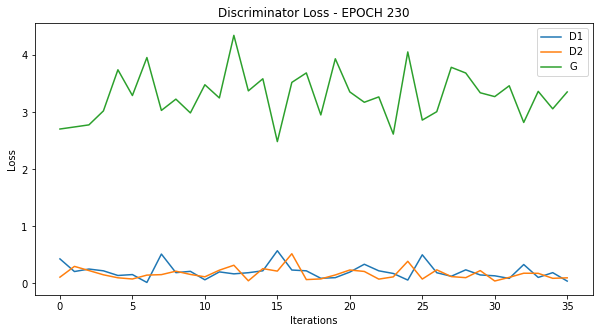

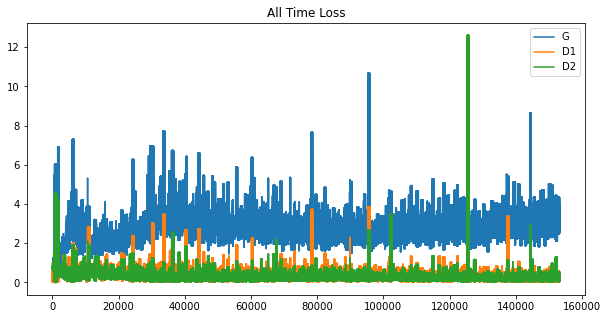

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 230/36, d1=0.081, d2=0.162, g=3.700
>1, 230/36, d1=0.295, d2=0.104, g=3.210
>2, 230/36, d1=0.194, d2=0.606, g=3.506
>3, 230/36, d1=0.613, d2=0.195, g=3.091
>4, 230/36, d1=0.249, d2=0.396, g=3.601
>5, 230/36, d1=0.147, d2=0.077, g=3.520
>6, 230/36, d1=0.061, d2=0.355, g=4.993
>7, 230/36, d1=0.657, d2=0.047, g=2.900
>8, 230/36, d1=0.048, d2=0.105, g=3.347
>9, 230/36, d1=0.231, d2=0.367, g=3.647
>10, 230/36, d1=0.383, d2=0.067, g=3.449
>11, 230/36, d1=0.221, d2=0.366, g=3.047
>12, 230/36, d1=0.291, d2=0.344, g=2.891
>13, 230/36, d1=0.096, d2=0.093, g=2.929
>14, 230/36, d1=0.276, d2=0.263, g=4.120
>15, 230/36, d1=0.311, d2=0.098, g=3.970
>16, 230/36, d1=0.698, d2=0.336, g=3.344
>17, 230/36, d1=0.170, d2=0.161, g=4.043
>18, 230/36, d1=0.036, d2=0.059, g=3.696
>19, 230/36, d1=0.136, d2=0.241, g=4.179
>20, 230/36, d1=0.518, d2=0.199, g=3.255
>21, 230/36, d1=0.189, d2=0.142, g=2.387
>22, 230/36, d1=0.207, d2=0.512, g=3.840
>23, 230/36, d1=0.554, d2=0.174, g=3.526
>24, 230/36, d1=0.166, d2=

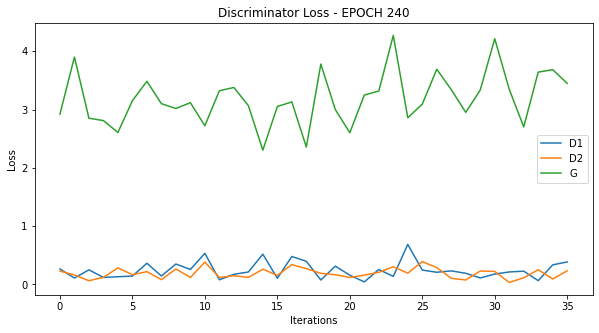

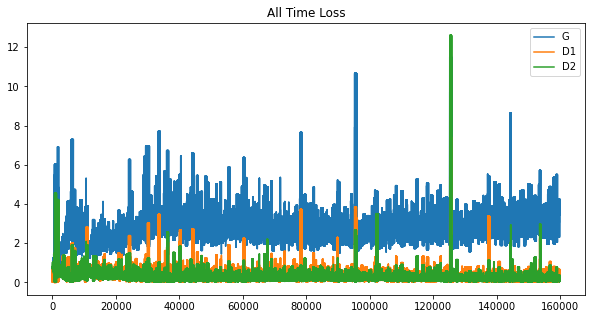

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 240/36, d1=0.140, d2=0.150, g=3.569
>1, 240/36, d1=0.164, d2=0.089, g=3.607
>2, 240/36, d1=0.196, d2=0.233, g=3.632
>3, 240/36, d1=0.203, d2=0.104, g=3.125
>4, 240/36, d1=0.237, d2=0.194, g=2.943
>5, 240/36, d1=0.198, d2=0.090, g=2.185
>6, 240/36, d1=0.051, d2=0.290, g=3.600
>7, 240/36, d1=0.085, d2=0.047, g=3.889
>8, 240/36, d1=0.387, d2=0.219, g=2.372
>9, 240/36, d1=0.184, d2=0.482, g=3.061
>10, 240/36, d1=0.334, d2=0.143, g=3.690
>11, 240/36, d1=0.322, d2=0.250, g=3.409
>12, 240/36, d1=0.176, d2=0.163, g=3.105
>13, 240/36, d1=0.033, d2=0.145, g=4.097
>14, 240/36, d1=0.356, d2=0.152, g=2.647
>15, 240/36, d1=0.062, d2=0.307, g=4.088
>16, 240/36, d1=0.437, d2=0.129, g=3.294
>17, 240/36, d1=0.221, d2=0.166, g=2.683
>18, 240/36, d1=0.064, d2=0.701, g=5.080
>19, 240/36, d1=1.103, d2=0.069, g=2.362
>20, 240/36, d1=0.155, d2=0.771, g=4.638
>21, 240/36, d1=0.341, d2=0.023, g=3.918
>22, 240/36, d1=0.386, d2=0.371, g=3.127
>23, 240/36, d1=0.154, d2=0.171, g=4.000
>24, 240/36, d1=0.126, d2=

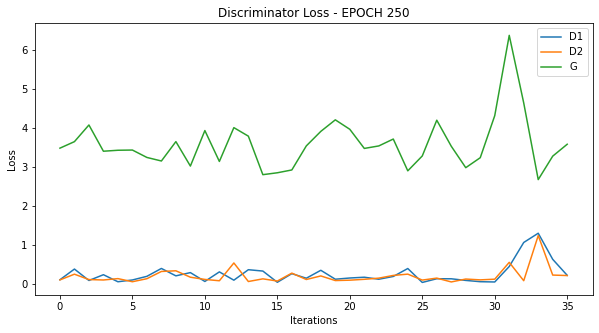

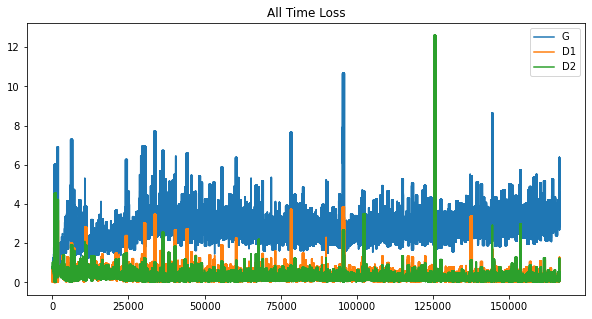

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 250/36, d1=0.414, d2=0.834, g=3.225
>1, 250/36, d1=0.976, d2=0.323, g=2.127
>2, 250/36, d1=0.124, d2=0.450, g=3.467
>3, 250/36, d1=0.369, d2=0.139, g=3.137
>4, 250/36, d1=0.229, d2=0.348, g=3.452
>5, 250/36, d1=0.105, d2=0.123, g=3.882
>6, 250/36, d1=0.303, d2=0.084, g=2.799
>7, 250/36, d1=0.292, d2=0.225, g=2.630
>8, 250/36, d1=0.409, d2=0.201, g=2.181
>9, 250/36, d1=0.075, d2=0.235, g=3.185
>10, 250/36, d1=0.290, d2=0.279, g=3.265
>11, 250/36, d1=0.186, d2=0.125, g=3.117
>12, 250/36, d1=0.329, d2=0.268, g=3.038
>13, 250/36, d1=0.147, d2=0.123, g=3.714
>14, 250/36, d1=0.272, d2=0.147, g=3.053
>15, 250/36, d1=0.114, d2=0.170, g=3.726
>16, 250/36, d1=0.130, d2=0.089, g=3.370
>17, 250/36, d1=0.118, d2=0.189, g=3.762
>18, 250/36, d1=0.338, d2=0.123, g=3.122
>19, 250/36, d1=0.144, d2=0.242, g=3.116
>20, 250/36, d1=0.138, d2=0.067, g=3.535
>21, 250/36, d1=0.414, d2=0.144, g=3.048
>22, 250/36, d1=0.094, d2=0.261, g=3.426
>23, 250/36, d1=0.091, d2=0.064, g=4.306
>24, 250/36, d1=0.376, d2=

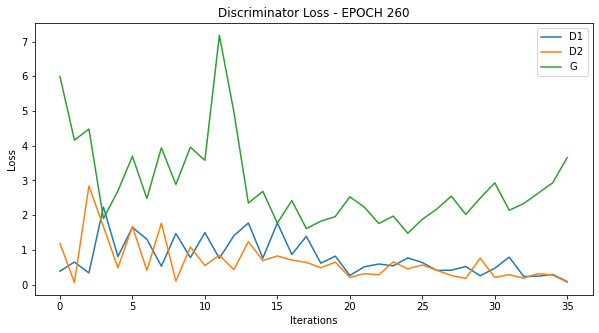

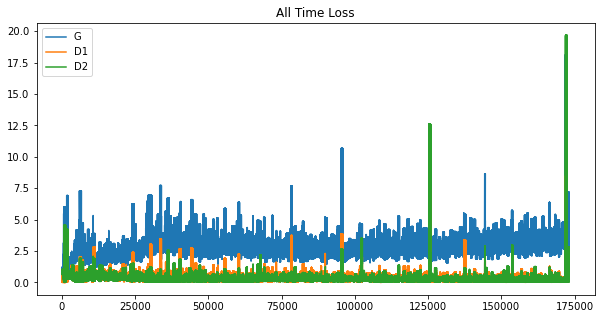

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 260/36, d1=0.332, d2=0.259, g=3.616
>1, 260/36, d1=0.755, d2=0.343, g=2.093
>2, 260/36, d1=0.006, d2=0.264, g=3.466
>3, 260/36, d1=0.295, d2=0.176, g=3.195
>4, 260/36, d1=0.713, d2=0.392, g=2.408
>5, 260/36, d1=0.239, d2=0.444, g=2.678
>6, 260/36, d1=0.176, d2=0.107, g=3.414
>7, 260/36, d1=0.659, d2=0.513, g=2.246
>8, 260/36, d1=0.280, d2=0.361, g=2.910
>9, 260/36, d1=0.727, d2=0.375, g=2.425
>10, 260/36, d1=0.592, d2=0.424, g=2.425
>11, 260/36, d1=0.495, d2=0.342, g=2.677
>12, 260/36, d1=0.786, d2=0.543, g=2.474
>13, 260/36, d1=0.379, d2=0.143, g=2.045
>14, 260/36, d1=0.507, d2=0.338, g=1.882
>15, 260/36, d1=0.248, d2=0.528, g=2.698
>16, 260/36, d1=0.313, d2=0.127, g=2.971
>17, 260/36, d1=0.348, d2=0.194, g=2.417
>18, 260/36, d1=0.240, d2=0.353, g=2.403
>19, 260/36, d1=0.172, d2=0.475, g=3.283
>20, 260/36, d1=0.718, d2=0.252, g=1.929
>21, 260/36, d1=0.242, d2=0.317, g=1.732
>22, 260/36, d1=0.199, d2=0.323, g=2.714
>23, 260/36, d1=0.339, d2=0.279, g=2.613
>24, 260/36, d1=0.551, d2=

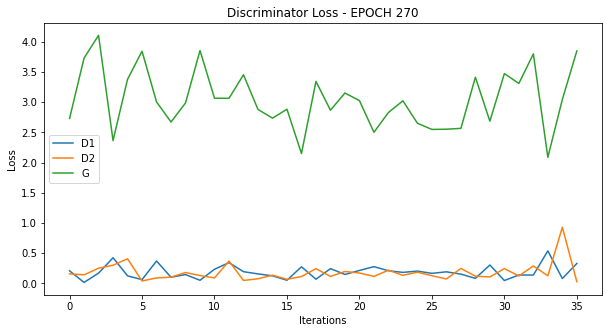

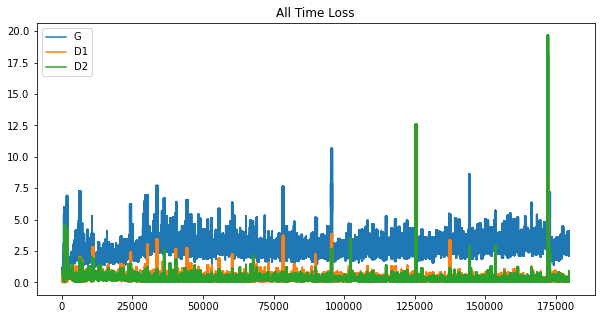

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 270/36, d1=0.487, d2=0.184, g=2.492
>1, 270/36, d1=0.116, d2=0.135, g=2.819
>2, 270/36, d1=0.112, d2=0.132, g=2.657
>3, 270/36, d1=0.128, d2=0.171, g=3.131
>4, 270/36, d1=0.263, d2=0.240, g=3.009
>5, 270/36, d1=0.043, d2=0.131, g=3.669
>6, 270/36, d1=0.487, d2=0.145, g=2.339
>7, 270/36, d1=0.161, d2=0.340, g=2.689
>8, 270/36, d1=0.164, d2=0.363, g=3.570
>9, 270/36, d1=0.385, d2=0.097, g=2.800
>10, 270/36, d1=0.031, d2=0.119, g=2.752
>11, 270/36, d1=0.298, d2=0.242, g=2.697
>12, 270/36, d1=0.247, d2=0.203, g=2.731
>13, 270/36, d1=0.235, d2=0.564, g=3.743
>14, 270/36, d1=0.335, d2=0.040, g=3.162
>15, 270/36, d1=0.416, d2=0.207, g=2.207
>16, 270/36, d1=0.038, d2=0.456, g=3.260
>17, 270/36, d1=0.282, d2=0.081, g=3.117
>18, 270/36, d1=0.280, d2=0.357, g=3.051
>19, 270/36, d1=0.120, d2=0.079, g=2.964
>20, 270/36, d1=0.176, d2=0.133, g=2.841
>21, 270/36, d1=0.047, d2=0.244, g=3.345
>22, 270/36, d1=0.279, d2=0.063, g=2.788
>23, 270/36, d1=0.278, d2=0.247, g=2.581
>24, 270/36, d1=0.259, d2=

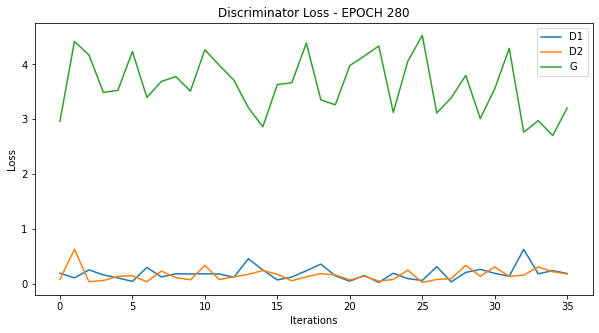

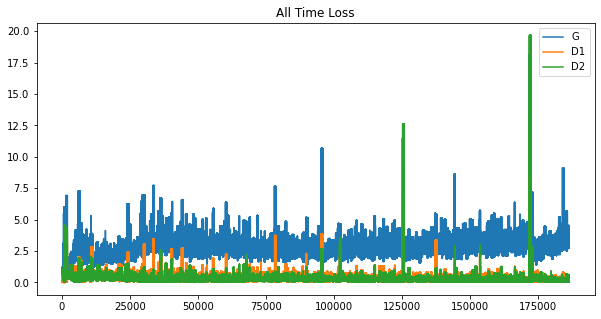

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 280/36, d1=0.125, d2=0.221, g=3.767
>1, 280/36, d1=0.322, d2=0.045, g=3.120
>2, 280/36, d1=0.102, d2=0.253, g=3.724
>3, 280/36, d1=0.369, d2=0.141, g=3.337
>4, 280/36, d1=0.169, d2=0.130, g=2.669
>5, 280/36, d1=0.077, d2=0.146, g=3.431
>6, 280/36, d1=0.267, d2=0.149, g=3.650
>7, 280/36, d1=0.072, d2=0.187, g=3.755
>8, 280/36, d1=0.167, d2=0.082, g=3.349
>9, 280/36, d1=0.260, d2=0.170, g=2.914
>10, 280/36, d1=0.169, d2=0.123, g=3.496
>11, 280/36, d1=0.123, d2=0.110, g=3.776
>12, 280/36, d1=0.168, d2=0.168, g=3.764
>13, 280/36, d1=0.236, d2=0.133, g=2.792
>14, 280/36, d1=0.265, d2=0.145, g=3.238
>15, 280/36, d1=0.159, d2=0.122, g=3.204
>16, 280/36, d1=0.074, d2=0.251, g=3.823
>17, 280/36, d1=0.282, d2=0.164, g=3.379
>18, 280/36, d1=0.149, d2=0.052, g=3.036
>19, 280/36, d1=0.247, d2=0.344, g=3.106
>20, 280/36, d1=0.135, d2=0.097, g=3.772
>21, 280/36, d1=0.153, d2=0.112, g=3.153
>22, 280/36, d1=0.014, d2=0.161, g=4.257
>23, 280/36, d1=0.138, d2=0.055, g=4.139
>24, 280/36, d1=0.397, d2=

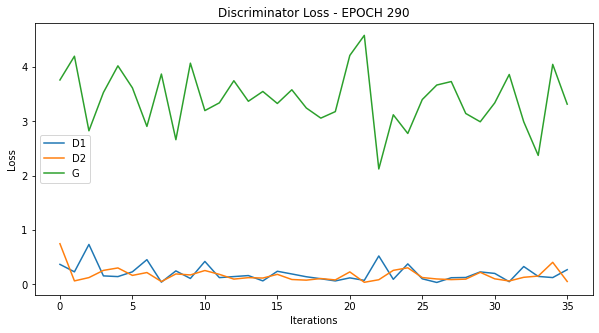

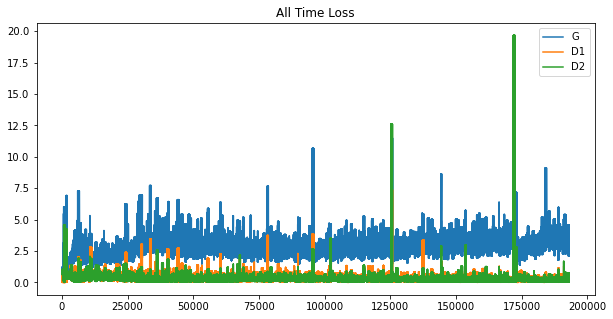

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 290/36, d1=0.130, d2=0.259, g=3.949
>1, 290/36, d1=0.118, d2=0.069, g=4.124
>2, 290/36, d1=0.244, d2=0.100, g=2.472
>3, 290/36, d1=0.035, d2=0.189, g=3.739
>4, 290/36, d1=0.057, d2=0.061, g=4.105
>5, 290/36, d1=0.152, d2=0.068, g=3.923
>6, 290/36, d1=0.234, d2=0.175, g=3.353
>7, 290/36, d1=0.015, d2=0.076, g=4.303
>8, 290/36, d1=0.124, d2=0.074, g=3.540
>9, 290/36, d1=0.116, d2=0.049, g=2.586
>10, 290/36, d1=0.097, d2=0.209, g=3.621
>11, 290/36, d1=0.064, d2=0.092, g=4.232
>12, 290/36, d1=0.412, d2=0.115, g=3.107
>13, 290/36, d1=0.103, d2=0.206, g=3.130
>14, 290/36, d1=0.033, d2=0.115, g=4.092
>15, 290/36, d1=0.469, d2=0.218, g=4.017
>16, 290/36, d1=0.091, d2=0.134, g=4.061
>17, 290/36, d1=0.193, d2=0.111, g=3.174
>18, 290/36, d1=0.217, d2=0.265, g=3.731
>19, 290/36, d1=0.117, d2=0.043, g=3.825
>20, 290/36, d1=0.107, d2=0.110, g=3.736
>21, 290/36, d1=0.113, d2=0.040, g=3.264
>22, 290/36, d1=0.214, d2=0.222, g=3.423
>23, 290/36, d1=0.138, d2=0.110, g=3.623
>24, 290/36, d1=0.161, d2=

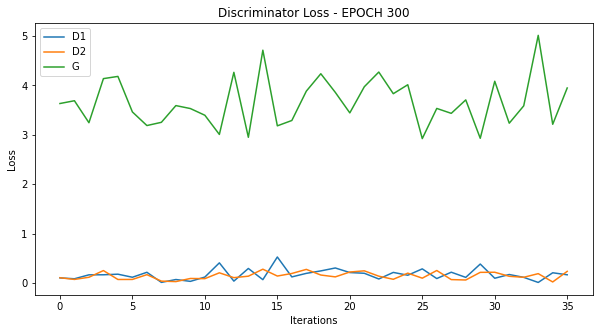

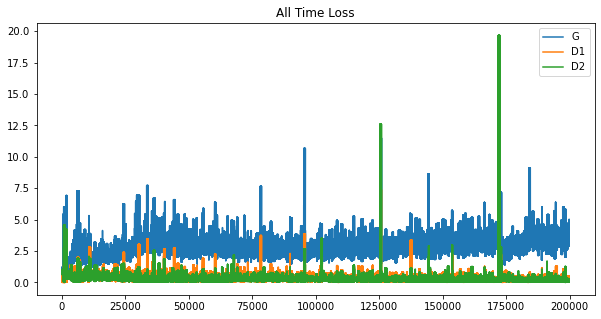

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 300/36, d1=0.164, d2=0.156, g=4.543
>1, 300/36, d1=0.143, d2=0.035, g=4.431
>2, 300/36, d1=0.132, d2=0.090, g=3.944
>3, 300/36, d1=0.155, d2=0.190, g=3.909
>4, 300/36, d1=0.201, d2=0.051, g=2.644
>5, 300/36, d1=0.079, d2=0.269, g=4.163
>6, 300/36, d1=0.103, d2=0.038, g=4.103
>7, 300/36, d1=0.328, d2=0.166, g=3.143
>8, 300/36, d1=0.087, d2=0.122, g=3.833
>9, 300/36, d1=0.237, d2=0.108, g=2.775
>10, 300/36, d1=0.352, d2=0.449, g=4.030
>11, 300/36, d1=0.047, d2=0.061, g=4.922
>12, 300/36, d1=0.298, d2=0.051, g=3.596
>13, 300/36, d1=0.135, d2=0.107, g=2.721
>14, 300/36, d1=0.154, d2=0.196, g=3.242
>15, 300/36, d1=0.189, d2=0.098, g=2.378
>16, 300/36, d1=0.055, d2=0.142, g=2.908
>17, 300/36, d1=0.032, d2=0.122, g=4.103
>18, 300/36, d1=0.089, d2=0.044, g=4.214
>19, 300/36, d1=0.297, d2=0.110, g=3.279
>20, 300/36, d1=0.006, d2=0.079, g=3.988
>21, 300/36, d1=0.052, d2=0.073, g=3.946
>22, 300/36, d1=0.149, d2=0.071, g=3.613
>23, 300/36, d1=0.167, d2=0.170, g=3.151
>24, 300/36, d1=0.123, d2=

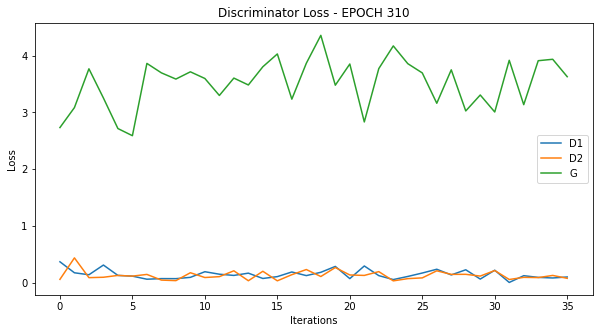

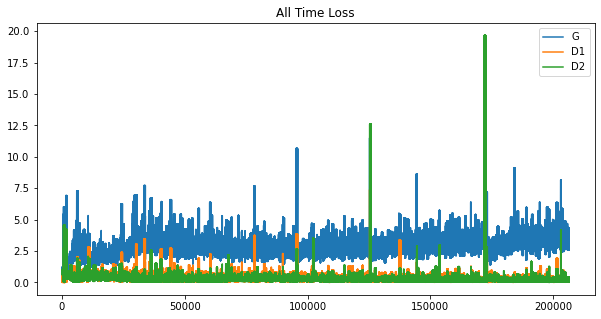

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 310/36, d1=0.166, d2=0.144, g=3.814
>1, 310/36, d1=0.122, d2=0.213, g=3.784
>2, 310/36, d1=0.074, d2=0.051, g=5.221
>3, 310/36, d1=0.468, d2=0.291, g=3.772
>4, 310/36, d1=0.033, d2=0.098, g=4.798
>5, 310/36, d1=0.096, d2=0.068, g=4.415
>6, 310/36, d1=0.370, d2=0.148, g=3.008
>7, 310/36, d1=0.082, d2=0.194, g=3.740
>8, 310/36, d1=0.256, d2=0.073, g=3.429
>9, 310/36, d1=0.139, d2=0.338, g=4.193
>10, 310/36, d1=0.096, d2=0.049, g=3.933
>11, 310/36, d1=0.247, d2=0.270, g=2.628
>12, 310/36, d1=0.027, d2=0.441, g=4.856
>13, 310/36, d1=0.537, d2=0.118, g=4.116
>14, 310/36, d1=0.207, d2=0.065, g=3.446
>15, 310/36, d1=0.238, d2=0.094, g=3.258
>16, 310/36, d1=0.067, d2=0.183, g=3.463
>17, 310/36, d1=0.069, d2=0.063, g=3.169
>18, 310/36, d1=0.024, d2=0.097, g=4.180
>19, 310/36, d1=0.433, d2=0.187, g=3.039
>20, 310/36, d1=0.143, d2=0.172, g=3.175
>21, 310/36, d1=0.082, d2=0.047, g=3.118
>22, 310/36, d1=0.114, d2=0.135, g=3.171
>23, 310/36, d1=0.130, d2=0.238, g=3.190
>24, 310/36, d1=0.060, d2=

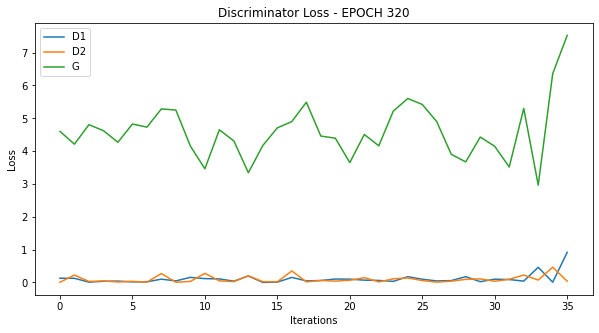

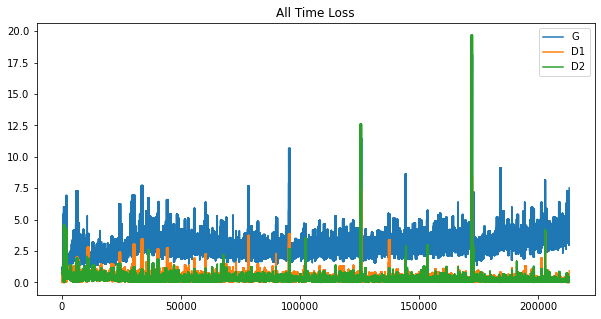

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 320/36, d1=1.857, d2=9.511, g=5.834
>1, 320/36, d1=1.804, d2=1.008, g=7.066
>2, 320/36, d1=3.078, d2=0.661, g=2.923
>3, 320/36, d1=0.913, d2=1.991, g=5.009
>4, 320/36, d1=1.217, d2=0.426, g=5.163
>5, 320/36, d1=0.904, d2=0.211, g=3.209
>6, 320/36, d1=1.227, d2=1.111, g=2.512
>7, 320/36, d1=0.418, d2=0.398, g=3.318
>8, 320/36, d1=0.185, d2=0.243, g=3.616
>9, 320/36, d1=0.612, d2=0.283, g=2.284
>10, 320/36, d1=0.368, d2=0.391, g=2.300
>11, 320/36, d1=0.478, d2=0.402, g=2.882
>12, 320/36, d1=0.076, d2=0.114, g=4.290
>13, 320/36, d1=0.630, d2=0.181, g=2.663
>14, 320/36, d1=0.118, d2=0.240, g=2.657
>15, 320/36, d1=0.265, d2=0.144, g=2.980
>16, 320/36, d1=0.422, d2=0.700, g=3.877
>17, 320/36, d1=0.232, d2=0.051, g=3.536
>18, 320/36, d1=0.701, d2=0.094, g=2.294
>19, 320/36, d1=0.132, d2=0.368, g=3.512
>20, 320/36, d1=0.131, d2=0.239, g=5.315
>21, 320/36, d1=0.546, d2=0.429, g=2.207
>22, 320/36, d1=0.168, d2=0.299, g=2.804
>23, 320/36, d1=0.466, d2=0.275, g=2.552
>24, 320/36, d1=0.014, d2=

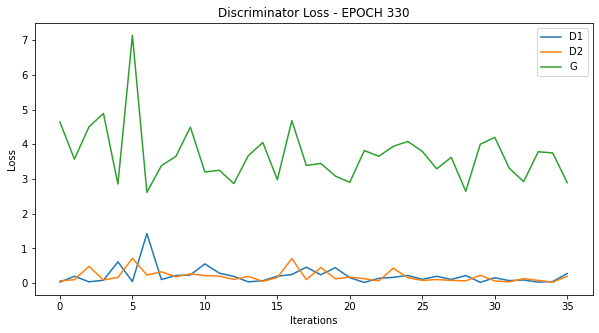

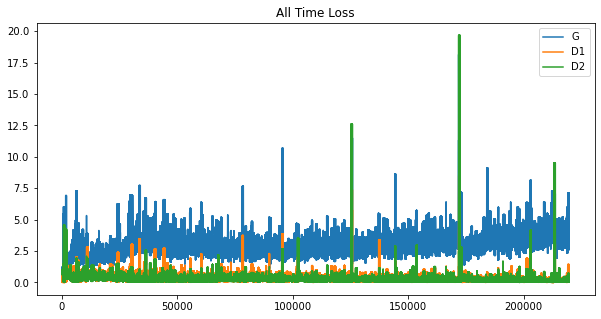

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 330/36, d1=0.122, d2=0.075, g=3.440
>1, 330/36, d1=0.146, d2=0.057, g=2.500
>2, 330/36, d1=0.033, d2=0.351, g=4.494
>3, 330/36, d1=0.124, d2=0.054, g=5.195
>4, 330/36, d1=0.157, d2=0.102, g=4.412
>5, 330/36, d1=0.244, d2=0.111, g=2.788
>6, 330/36, d1=0.014, d2=0.165, g=4.261
>7, 330/36, d1=0.122, d2=0.144, g=4.953
>8, 330/36, d1=0.268, d2=0.054, g=3.840
>9, 330/36, d1=0.063, d2=0.295, g=4.610
>10, 330/36, d1=0.174, d2=0.097, g=4.605
>11, 330/36, d1=0.066, d2=0.029, g=4.542
>12, 330/36, d1=0.082, d2=0.126, g=4.043
>13, 330/36, d1=0.055, d2=0.027, g=4.010
>14, 330/36, d1=0.126, d2=0.123, g=3.903
>15, 330/36, d1=0.087, d2=0.086, g=4.100
>16, 330/36, d1=0.105, d2=0.068, g=3.965
>17, 330/36, d1=0.147, d2=0.210, g=4.294
>18, 330/36, d1=0.182, d2=0.167, g=4.403
>19, 330/36, d1=0.053, d2=0.034, g=4.092
>20, 330/36, d1=0.288, d2=0.109, g=3.720
>21, 330/36, d1=0.155, d2=0.288, g=4.421
>22, 330/36, d1=0.280, d2=0.099, g=3.374
>23, 330/36, d1=0.078, d2=0.114, g=4.471
>24, 330/36, d1=0.166, d2=

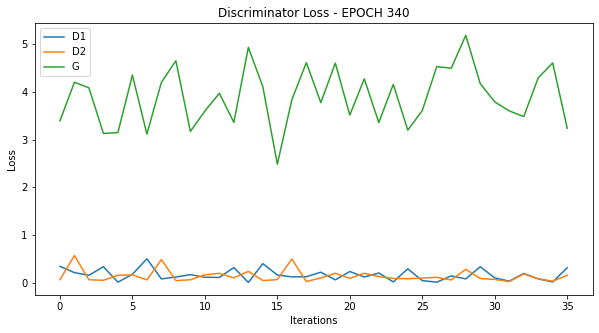

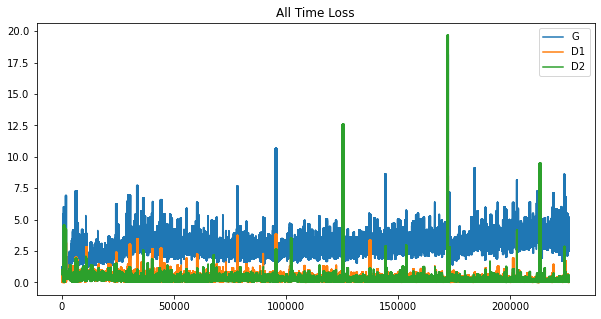

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 340/36, d1=0.035, d2=0.243, g=5.035
>1, 340/36, d1=0.382, d2=0.163, g=3.455
>2, 340/36, d1=0.103, d2=0.115, g=3.955
>3, 340/36, d1=0.142, d2=0.091, g=3.785
>4, 340/36, d1=0.066, d2=0.060, g=3.649
>5, 340/36, d1=0.164, d2=0.127, g=2.954
>6, 340/36, d1=0.073, d2=0.088, g=3.866
>7, 340/36, d1=0.147, d2=0.154, g=3.466
>8, 340/36, d1=0.198, d2=0.169, g=3.943
>9, 340/36, d1=0.291, d2=0.070, g=3.791
>10, 340/36, d1=0.044, d2=0.120, g=4.245
>11, 340/36, d1=0.195, d2=0.154, g=3.633
>12, 340/36, d1=0.099, d2=0.026, g=4.495
>13, 340/36, d1=0.223, d2=0.056, g=3.119
>14, 340/36, d1=0.060, d2=0.206, g=4.276
>15, 340/36, d1=0.087, d2=0.033, g=4.739
>16, 340/36, d1=0.161, d2=0.064, g=4.058
>17, 340/36, d1=0.168, d2=0.218, g=3.637
>18, 340/36, d1=0.074, d2=0.132, g=3.773
>19, 340/36, d1=0.207, d2=0.050, g=2.989
>20, 340/36, d1=0.061, d2=0.236, g=4.058
>21, 340/36, d1=0.075, d2=0.089, g=4.632
>22, 340/36, d1=0.058, d2=0.037, g=4.060
>23, 340/36, d1=0.131, d2=0.033, g=3.119
>24, 340/36, d1=0.030, d2=

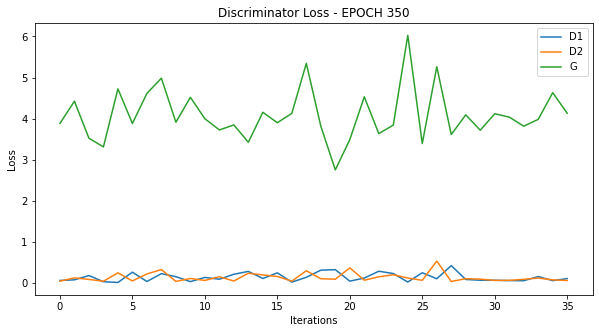

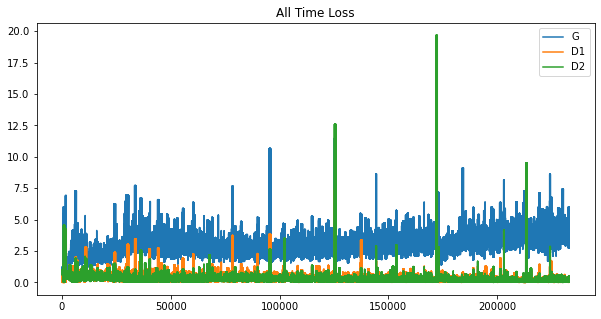

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 350/36, d1=0.090, d2=0.071, g=3.700
>1, 350/36, d1=0.034, d2=0.138, g=4.322
>2, 350/36, d1=0.109, d2=0.035, g=4.945
>3, 350/36, d1=0.109, d2=0.065, g=4.323
>4, 350/36, d1=0.111, d2=0.028, g=3.449
>5, 350/36, d1=0.024, d2=0.140, g=4.444
>6, 350/36, d1=0.101, d2=0.071, g=4.611
>7, 350/36, d1=0.012, d2=0.028, g=4.411
>8, 350/36, d1=0.050, d2=0.037, g=4.178
>9, 350/36, d1=0.023, d2=0.049, g=3.985
>10, 350/36, d1=0.156, d2=0.093, g=4.239
>11, 350/36, d1=0.057, d2=0.048, g=4.098
>12, 350/36, d1=0.119, d2=0.130, g=3.544
>13, 350/36, d1=0.052, d2=0.105, g=4.549
>14, 350/36, d1=0.085, d2=0.058, g=4.478
>15, 350/36, d1=0.193, d2=0.082, g=3.575
>16, 350/36, d1=0.089, d2=0.158, g=4.620
>17, 350/36, d1=0.033, d2=0.029, g=5.126
>18, 350/36, d1=0.165, d2=0.054, g=3.479
>19, 350/36, d1=0.014, d2=0.473, g=4.616
>20, 350/36, d1=0.035, d2=0.016, g=5.153
>21, 350/36, d1=0.527, d2=0.294, g=4.689
>22, 350/36, d1=0.110, d2=0.207, g=5.102
>23, 350/36, d1=0.009, d2=0.002, g=7.021
>24, 350/36, d1=0.045, d2=

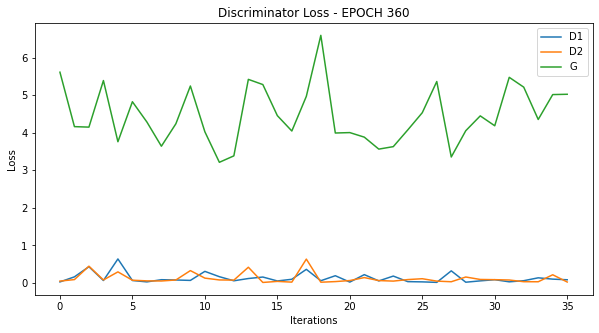

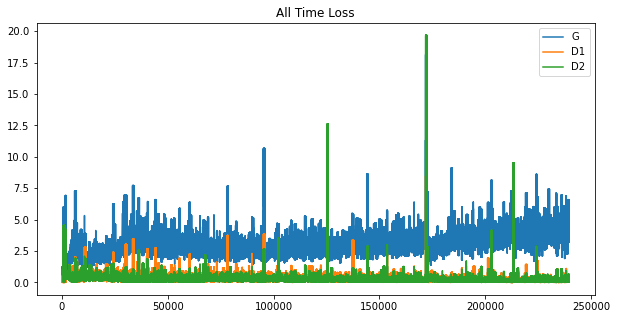

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 360/36, d1=0.234, d2=0.193, g=3.870
>1, 360/36, d1=0.079, d2=0.033, g=4.121
>2, 360/36, d1=0.013, d2=0.053, g=4.435
>3, 360/36, d1=0.089, d2=0.038, g=3.615
>4, 360/36, d1=0.178, d2=0.251, g=4.357
>5, 360/36, d1=0.085, d2=0.037, g=4.318
>6, 360/36, d1=0.131, d2=0.097, g=3.806
>7, 360/36, d1=0.077, d2=0.130, g=3.883
>8, 360/36, d1=0.209, d2=0.118, g=4.354
>9, 360/36, d1=0.142, d2=0.054, g=3.348
>10, 360/36, d1=0.068, d2=0.080, g=3.576
>11, 360/36, d1=0.018, d2=0.098, g=4.386
>12, 360/36, d1=0.257, d2=0.039, g=3.612
>13, 360/36, d1=0.057, d2=0.144, g=3.772
>14, 360/36, d1=0.081, d2=0.067, g=4.124
>15, 360/36, d1=0.079, d2=0.030, g=3.672
>16, 360/36, d1=0.086, d2=0.041, g=3.784
>17, 360/36, d1=0.062, d2=0.115, g=4.340
>18, 360/36, d1=0.107, d2=0.257, g=3.910
>19, 360/36, d1=0.087, d2=0.084, g=4.315
>20, 360/36, d1=0.350, d2=0.165, g=3.865
>21, 360/36, d1=0.036, d2=0.052, g=3.797
>22, 360/36, d1=0.076, d2=0.101, g=4.456
>23, 360/36, d1=0.058, d2=0.040, g=4.180
>24, 360/36, d1=0.039, d2=

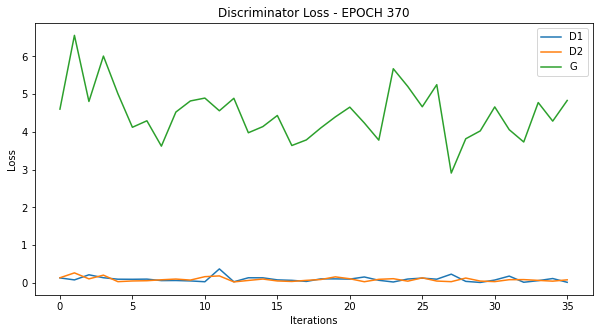

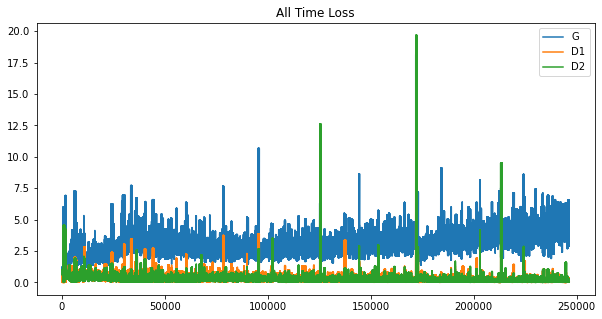

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 370/36, d1=0.045, d2=0.079, g=5.057
>1, 370/36, d1=0.111, d2=0.057, g=4.164
>2, 370/36, d1=0.231, d2=0.160, g=4.909
>3, 370/36, d1=0.060, d2=0.022, g=4.530
>4, 370/36, d1=0.252, d2=0.083, g=2.680
>5, 370/36, d1=0.045, d2=0.404, g=6.185
>6, 370/36, d1=0.775, d2=0.132, g=3.752
>7, 370/36, d1=0.326, d2=0.462, g=4.309
>8, 370/36, d1=0.091, d2=0.079, g=4.838
>9, 370/36, d1=0.256, d2=0.605, g=5.725
>10, 370/36, d1=0.075, d2=0.011, g=6.498
>11, 370/36, d1=0.794, d2=0.160, g=3.091
>12, 370/36, d1=0.011, d2=0.108, g=3.615
>13, 370/36, d1=0.090, d2=0.138, g=4.860
>14, 370/36, d1=0.113, d2=0.120, g=4.943
>15, 370/36, d1=0.050, d2=0.037, g=4.258
>16, 370/36, d1=0.086, d2=0.105, g=4.135
>17, 370/36, d1=0.003, d2=0.067, g=4.676
>18, 370/36, d1=0.024, d2=0.036, g=4.717
>19, 370/36, d1=0.272, d2=0.335, g=5.484
>20, 370/36, d1=0.243, d2=0.058, g=4.295
>21, 370/36, d1=0.105, d2=0.034, g=3.960
>22, 370/36, d1=0.186, d2=0.039, g=2.928
>23, 370/36, d1=0.080, d2=0.289, g=4.822
>24, 370/36, d1=0.043, d2=

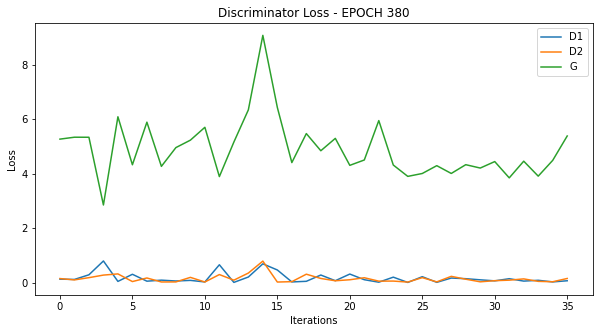

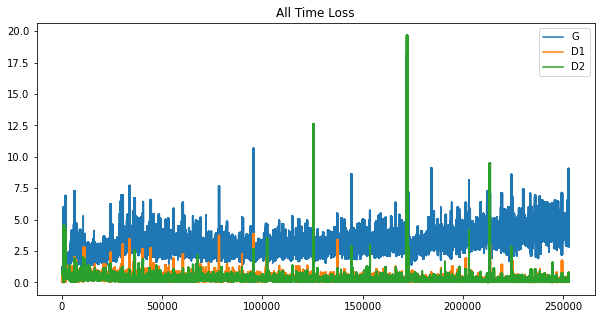

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 380/36, d1=0.145, d2=0.121, g=6.494
>1, 380/36, d1=0.090, d2=0.039, g=5.232
>2, 380/36, d1=0.009, d2=0.017, g=5.636
>3, 380/36, d1=0.229, d2=0.049, g=3.485
>4, 380/36, d1=0.090, d2=0.256, g=4.409
>5, 380/36, d1=0.074, d2=0.071, g=4.486
>6, 380/36, d1=0.112, d2=0.063, g=4.464
>7, 380/36, d1=0.027, d2=0.128, g=5.082
>8, 380/36, d1=0.376, d2=0.191, g=4.615
>9, 380/36, d1=0.063, d2=0.078, g=5.828
>10, 380/36, d1=0.145, d2=0.019, g=4.897
>11, 380/36, d1=0.104, d2=0.123, g=4.806
>12, 380/36, d1=0.128, d2=0.063, g=4.413
>13, 380/36, d1=0.114, d2=0.043, g=4.346
>14, 380/36, d1=0.099, d2=0.245, g=5.090
>15, 380/36, d1=0.064, d2=0.029, g=5.291
>16, 380/36, d1=0.277, d2=0.126, g=3.617
>17, 380/36, d1=0.059, d2=0.219, g=4.917
>18, 380/36, d1=0.062, d2=0.053, g=5.956
>19, 380/36, d1=0.318, d2=0.194, g=4.144
>20, 380/36, d1=0.009, d2=0.044, g=4.177
>21, 380/36, d1=0.050, d2=0.052, g=5.276
>22, 380/36, d1=0.051, d2=0.019, g=3.955
>23, 380/36, d1=0.116, d2=0.098, g=4.526
>24, 380/36, d1=0.030, d2=

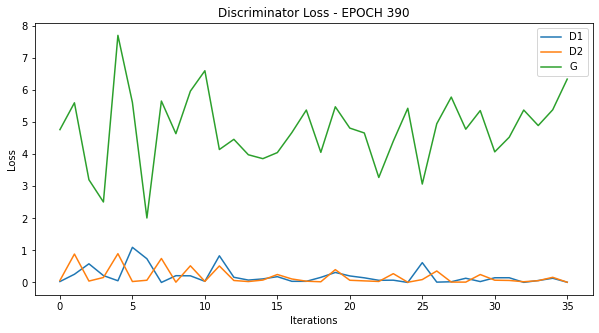

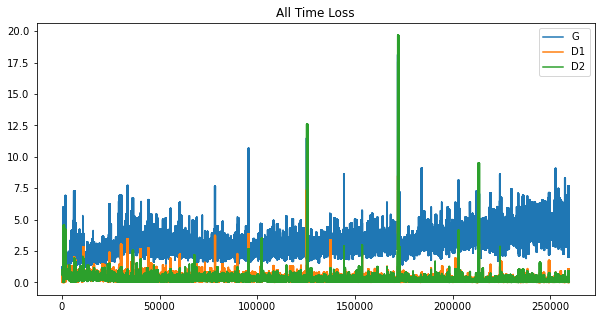

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 390/36, d1=0.397, d2=0.041, g=3.266
>1, 390/36, d1=0.004, d2=0.223, g=5.274
>2, 390/36, d1=0.192, d2=0.086, g=4.217
>3, 390/36, d1=0.249, d2=0.063, g=3.983
>4, 390/36, d1=0.064, d2=0.303, g=5.162
>5, 390/36, d1=0.120, d2=0.016, g=4.611
>6, 390/36, d1=0.146, d2=0.142, g=3.914
>7, 390/36, d1=0.019, d2=0.021, g=4.530
>8, 390/36, d1=0.037, d2=0.096, g=5.022
>9, 390/36, d1=0.139, d2=0.112, g=5.971
>10, 390/36, d1=0.318, d2=0.074, g=4.423
>11, 390/36, d1=0.046, d2=0.042, g=4.161
>12, 390/36, d1=0.057, d2=0.238, g=4.682
>13, 390/36, d1=0.075, d2=0.022, g=5.229
>14, 390/36, d1=0.172, d2=0.035, g=4.239
>15, 390/36, d1=0.026, d2=0.148, g=4.709
>16, 390/36, d1=0.090, d2=0.040, g=3.868
>17, 390/36, d1=0.085, d2=0.125, g=4.494
>18, 390/36, d1=0.121, d2=0.029, g=4.731
>19, 390/36, d1=0.043, d2=0.054, g=3.707
>20, 390/36, d1=0.322, d2=0.237, g=4.408
>21, 390/36, d1=0.034, d2=0.076, g=4.346
>22, 390/36, d1=0.091, d2=0.042, g=4.167
>23, 390/36, d1=0.058, d2=0.097, g=4.231
>24, 390/36, d1=0.095, d2=

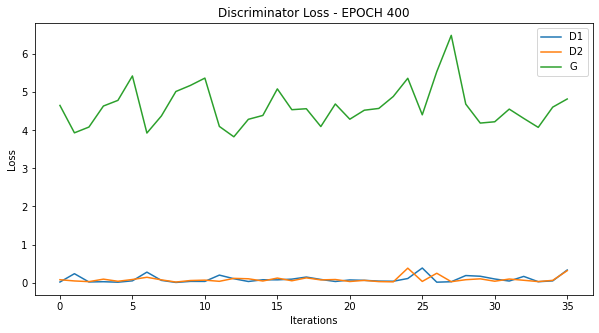

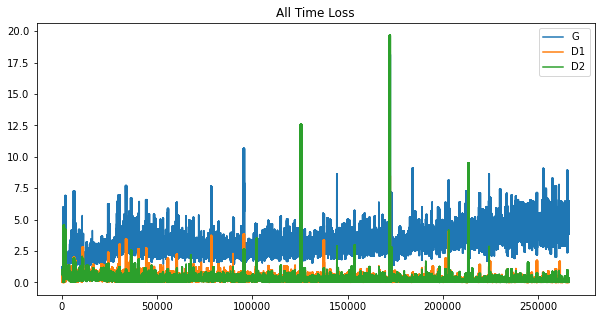

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 400/36, d1=0.057, d2=0.049, g=5.896
>1, 400/36, d1=0.223, d2=0.094, g=4.856
>2, 400/36, d1=0.125, d2=0.091, g=5.376
>3, 400/36, d1=0.123, d2=0.031, g=3.726
>4, 400/36, d1=0.047, d2=0.197, g=5.194
>5, 400/36, d1=0.086, d2=0.033, g=5.616
>6, 400/36, d1=0.333, d2=0.194, g=3.991
>7, 400/36, d1=0.067, d2=0.031, g=4.203
>8, 400/36, d1=0.040, d2=0.068, g=4.636
>9, 400/36, d1=0.011, d2=0.019, g=5.291
>10, 400/36, d1=0.037, d2=0.028, g=5.206
>11, 400/36, d1=0.070, d2=0.032, g=4.820
>12, 400/36, d1=0.090, d2=0.174, g=3.842
>13, 400/36, d1=0.026, d2=0.059, g=5.203
>14, 400/36, d1=0.172, d2=0.046, g=3.687
>15, 400/36, d1=0.031, d2=0.341, g=5.166
>16, 400/36, d1=0.288, d2=0.044, g=3.591
>17, 400/36, d1=0.009, d2=0.110, g=4.873
>18, 400/36, d1=0.098, d2=0.018, g=4.894
>19, 400/36, d1=0.041, d2=0.052, g=4.836
>20, 400/36, d1=0.023, d2=0.039, g=5.151
>21, 400/36, d1=0.019, d2=0.045, g=5.574
>22, 400/36, d1=0.031, d2=0.114, g=6.236
>23, 400/36, d1=0.126, d2=0.023, g=6.725
>24, 400/36, d1=0.060, d2=

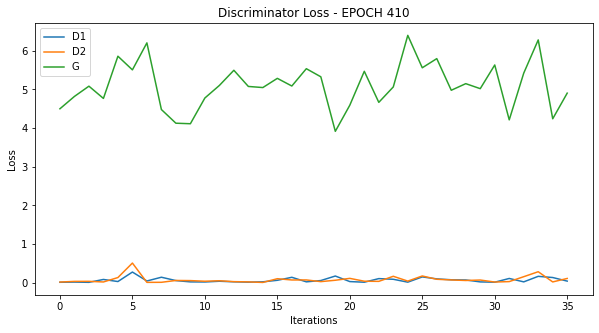

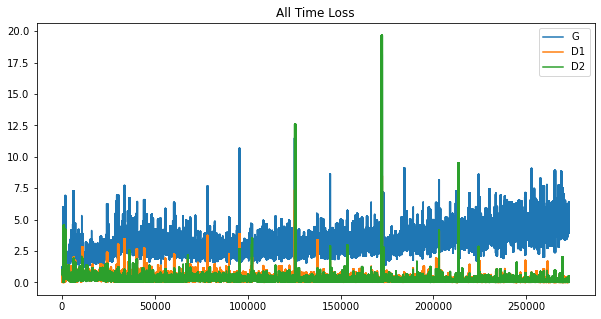

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 410/36, d1=0.154, d2=0.049, g=4.259
>1, 410/36, d1=0.002, d2=0.138, g=5.541
>2, 410/36, d1=0.065, d2=0.335, g=8.143
>3, 410/36, d1=0.330, d2=0.434, g=8.495
>4, 410/36, d1=1.323, d2=0.043, g=9.201
>5, 410/36, d1=2.368, d2=12.722, g=8.838
>6, 410/36, d1=3.265, d2=5.963, g=21.148
>7, 410/36, d1=10.974, d2=1.856, g=4.628
>8, 410/36, d1=0.739, d2=0.633, g=8.300
>9, 410/36, d1=1.361, d2=1.593, g=6.711
>10, 410/36, d1=1.036, d2=2.165, g=6.351
>11, 410/36, d1=1.607, d2=0.118, g=4.092
>12, 410/36, d1=0.340, d2=0.580, g=3.942
>13, 410/36, d1=0.189, d2=0.470, g=5.535
>14, 410/36, d1=0.580, d2=0.072, g=3.850
>15, 410/36, d1=0.150, d2=0.433, g=4.235
>16, 410/36, d1=0.244, d2=0.304, g=4.898
>17, 410/36, d1=0.567, d2=0.222, g=3.658
>18, 410/36, d1=0.485, d2=0.844, g=5.318
>19, 410/36, d1=0.148, d2=0.006, g=5.718
>20, 410/36, d1=0.199, d2=0.223, g=5.148
>21, 410/36, d1=0.247, d2=0.242, g=3.542
>22, 410/36, d1=0.172, d2=0.113, g=3.830
>23, 410/36, d1=0.254, d2=0.212, g=3.163
>24, 410/36, d1=0.285, 

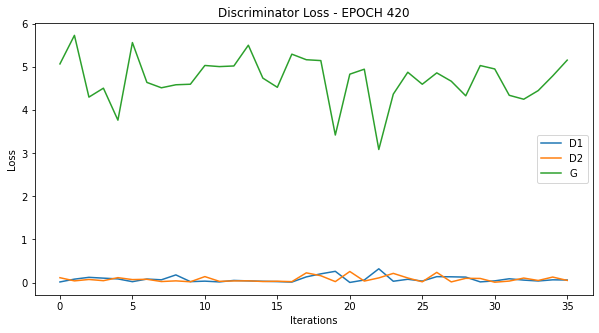

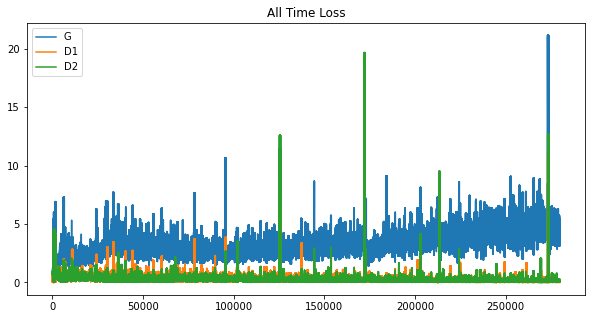

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 420/36, d1=0.052, d2=0.006, g=5.283
>1, 420/36, d1=0.226, d2=0.211, g=4.244
>2, 420/36, d1=0.016, d2=0.182, g=5.196
>3, 420/36, d1=0.090, d2=0.006, g=5.965
>4, 420/36, d1=0.042, d2=0.011, g=4.794
>5, 420/36, d1=0.125, d2=0.103, g=4.631
>6, 420/36, d1=0.060, d2=0.145, g=5.481
>7, 420/36, d1=0.190, d2=0.097, g=5.225
>8, 420/36, d1=0.139, d2=0.027, g=4.551
>9, 420/36, d1=0.110, d2=0.047, g=3.584
>10, 420/36, d1=0.003, d2=0.214, g=4.608
>11, 420/36, d1=0.092, d2=0.150, g=5.930
>12, 420/36, d1=0.117, d2=0.020, g=5.001
>13, 420/36, d1=0.037, d2=0.011, g=4.836
>14, 420/36, d1=0.038, d2=0.130, g=4.876
>15, 420/36, d1=0.031, d2=0.008, g=5.878
>16, 420/36, d1=0.064, d2=0.015, g=3.877
>17, 420/36, d1=0.012, d2=0.088, g=4.986
>18, 420/36, d1=0.282, d2=0.058, g=4.323
>19, 420/36, d1=0.013, d2=0.100, g=4.397
>20, 420/36, d1=0.073, d2=0.131, g=5.628
>21, 420/36, d1=0.120, d2=0.041, g=5.991
>22, 420/36, d1=0.035, d2=0.012, g=5.057
>23, 420/36, d1=0.040, d2=0.030, g=5.165
>24, 420/36, d1=0.041, d2=

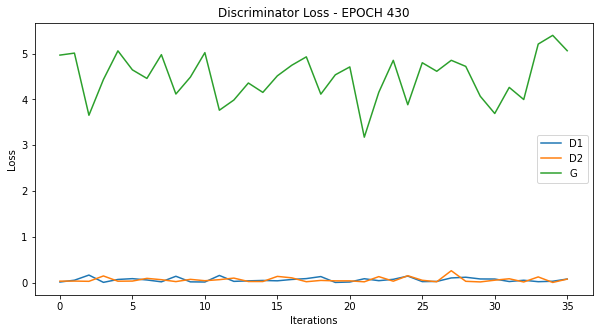

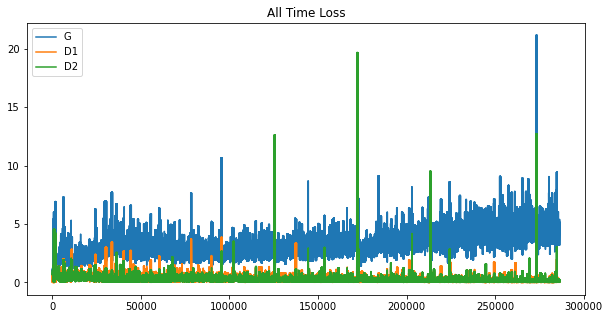

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 430/36, d1=0.034, d2=0.032, g=5.384
>1, 430/36, d1=0.104, d2=0.094, g=5.074
>2, 430/36, d1=0.036, d2=0.159, g=6.488
>3, 430/36, d1=0.280, d2=0.019, g=4.313
>4, 430/36, d1=0.004, d2=0.012, g=3.939
>5, 430/36, d1=0.008, d2=0.731, g=5.741
>6, 430/36, d1=0.181, d2=0.011, g=5.251
>7, 430/36, d1=0.226, d2=0.027, g=4.113
>8, 430/36, d1=0.011, d2=0.077, g=4.399
>9, 430/36, d1=0.056, d2=0.021, g=4.392
>10, 430/36, d1=0.010, d2=0.037, g=4.351
>11, 430/36, d1=0.047, d2=0.025, g=4.660
>12, 430/36, d1=0.032, d2=0.051, g=4.663
>13, 430/36, d1=0.007, d2=0.051, g=5.449
>14, 430/36, d1=0.068, d2=0.014, g=4.603
>15, 430/36, d1=0.156, d2=0.065, g=3.450
>16, 430/36, d1=0.013, d2=0.085, g=4.406
>17, 430/36, d1=0.017, d2=0.102, g=5.710
>18, 430/36, d1=0.174, d2=0.045, g=4.461
>19, 430/36, d1=0.334, d2=0.373, g=4.700
>20, 430/36, d1=0.278, d2=0.285, g=4.441
>21, 430/36, d1=0.039, d2=0.029, g=5.342
>22, 430/36, d1=0.110, d2=0.019, g=5.516
>23, 430/36, d1=0.100, d2=0.037, g=4.421
>24, 430/36, d1=0.022, d2=

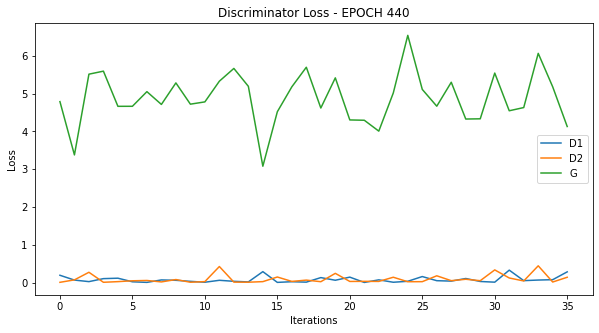

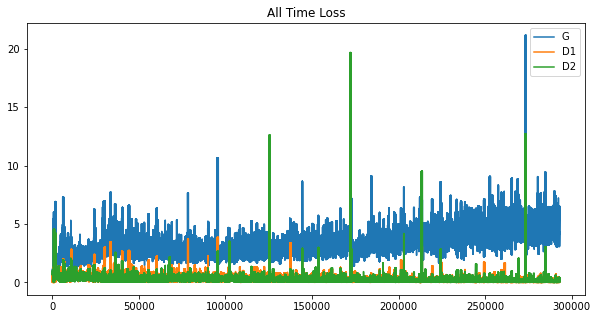

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 440/36, d1=0.096, d2=0.121, g=4.404
>1, 440/36, d1=0.032, d2=0.095, g=5.468
>2, 440/36, d1=0.114, d2=0.010, g=5.167
>3, 440/36, d1=0.033, d2=0.020, g=4.322
>4, 440/36, d1=0.064, d2=0.065, g=5.199
>5, 440/36, d1=0.094, d2=0.019, g=4.781
>6, 440/36, d1=0.005, d2=0.088, g=5.096
>7, 440/36, d1=0.060, d2=0.029, g=4.695
>8, 440/36, d1=0.061, d2=0.251, g=5.106
>9, 440/36, d1=0.145, d2=0.048, g=5.130
>10, 440/36, d1=0.022, d2=0.026, g=4.171
>11, 440/36, d1=0.044, d2=0.063, g=4.777
>12, 440/36, d1=0.013, d2=0.022, g=4.327
>13, 440/36, d1=0.019, d2=0.014, g=4.316
>14, 440/36, d1=0.110, d2=0.078, g=4.326
>15, 440/36, d1=0.052, d2=0.114, g=4.732
>16, 440/36, d1=0.044, d2=0.029, g=4.382
>17, 440/36, d1=0.014, d2=0.082, g=6.093
>18, 440/36, d1=0.075, d2=0.003, g=6.739
>19, 440/36, d1=0.021, d2=0.018, g=5.342
>20, 440/36, d1=0.039, d2=0.017, g=5.431
>21, 440/36, d1=0.005, d2=0.136, g=5.818
>22, 440/36, d1=0.079, d2=0.109, g=6.109
>23, 440/36, d1=0.235, d2=0.042, g=4.553
>24, 440/36, d1=0.082, d2=

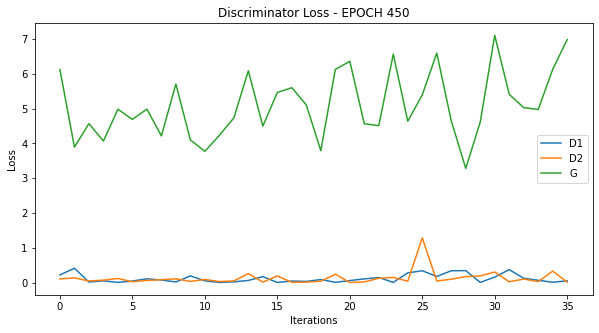

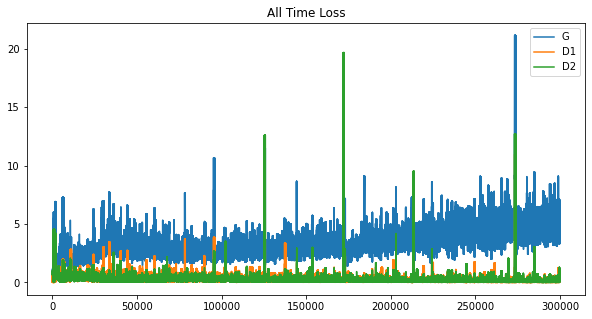

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 450/36, d1=0.590, d2=0.235, g=3.904
>1, 450/36, d1=0.029, d2=0.031, g=4.251
>2, 450/36, d1=0.072, d2=0.412, g=4.894
>3, 450/36, d1=0.149, d2=0.037, g=5.187
>4, 450/36, d1=0.029, d2=0.021, g=4.993
>5, 450/36, d1=0.012, d2=0.015, g=4.692
>6, 450/36, d1=0.028, d2=0.055, g=4.964
>7, 450/36, d1=0.123, d2=0.044, g=4.791
>8, 450/36, d1=0.110, d2=0.050, g=4.011
>9, 450/36, d1=0.004, d2=0.029, g=4.258
>10, 450/36, d1=0.003, d2=0.320, g=5.806
>11, 450/36, d1=0.046, d2=0.011, g=6.262
>12, 450/36, d1=0.144, d2=0.008, g=5.117
>13, 450/36, d1=0.163, d2=0.033, g=4.273
>14, 450/36, d1=0.066, d2=0.129, g=4.279
>15, 450/36, d1=0.018, d2=0.019, g=4.972
>16, 450/36, d1=0.079, d2=0.126, g=5.075
>17, 450/36, d1=0.060, d2=0.052, g=5.878
>18, 450/36, d1=0.154, d2=0.156, g=4.556
>19, 450/36, d1=0.203, d2=0.033, g=3.847
>20, 450/36, d1=0.030, d2=0.085, g=4.283
>21, 450/36, d1=0.018, d2=0.092, g=6.175
>22, 450/36, d1=0.124, d2=0.016, g=6.297
>23, 450/36, d1=0.059, d2=0.069, g=5.137
>24, 450/36, d1=0.193, d2=

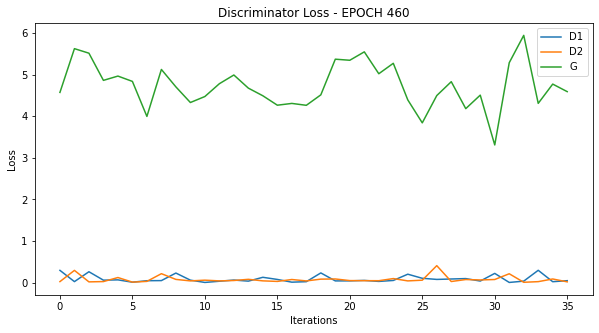

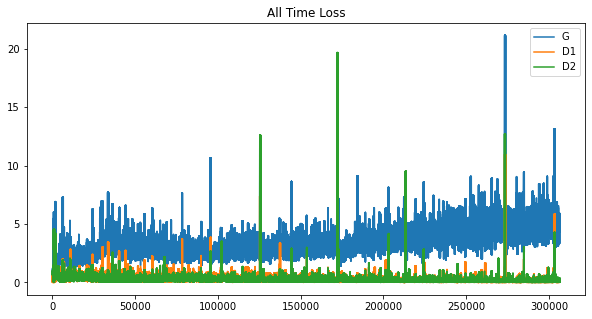

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 460/36, d1=0.013, d2=0.048, g=4.601
>1, 460/36, d1=0.146, d2=0.118, g=4.138
>2, 460/36, d1=0.064, d2=0.401, g=5.372
>3, 460/36, d1=0.033, d2=0.009, g=5.069
>4, 460/36, d1=0.153, d2=0.060, g=4.987
>5, 460/36, d1=0.123, d2=0.020, g=3.960
>6, 460/36, d1=0.134, d2=0.394, g=3.933
>7, 460/36, d1=0.023, d2=0.027, g=4.975
>8, 460/36, d1=0.141, d2=0.121, g=4.694
>9, 460/36, d1=0.004, d2=0.022, g=4.587
>10, 460/36, d1=0.034, d2=0.039, g=4.839
>11, 460/36, d1=0.035, d2=0.087, g=5.651
>12, 460/36, d1=0.142, d2=0.371, g=6.265
>13, 460/36, d1=0.102, d2=0.013, g=5.656
>14, 460/36, d1=0.614, d2=0.184, g=3.539
>15, 460/36, d1=0.013, d2=0.373, g=4.796
>16, 460/36, d1=0.122, d2=0.042, g=5.409
>17, 460/36, d1=0.228, d2=0.327, g=5.470
>18, 460/36, d1=0.018, d2=0.037, g=5.886
>19, 460/36, d1=0.117, d2=0.066, g=5.901
>20, 460/36, d1=0.054, d2=0.154, g=4.931
>21, 460/36, d1=0.245, d2=0.016, g=5.155
>22, 460/36, d1=0.017, d2=0.209, g=5.192
>23, 460/36, d1=0.162, d2=0.030, g=5.254
>24, 460/36, d1=0.211, d2=

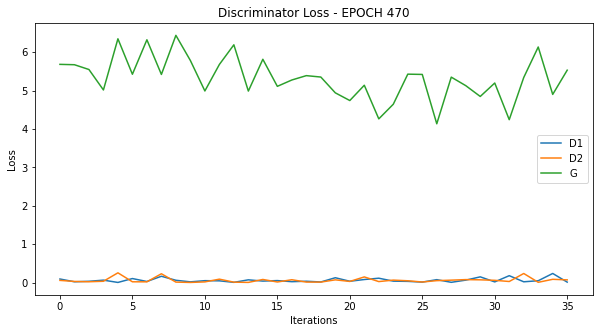

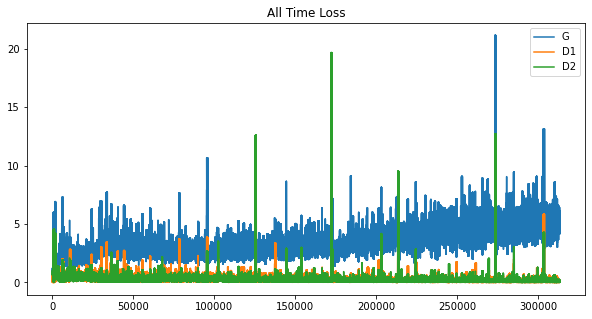

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 470/36, d1=0.055, d2=0.030, g=5.578
>1, 470/36, d1=0.020, d2=0.027, g=4.586
>2, 470/36, d1=0.021, d2=0.008, g=5.318
>3, 470/36, d1=0.048, d2=0.109, g=5.428
>4, 470/36, d1=0.032, d2=0.028, g=5.871
>5, 470/36, d1=0.053, d2=0.146, g=5.622
>6, 470/36, d1=0.084, d2=0.030, g=5.342
>7, 470/36, d1=0.052, d2=0.071, g=4.785
>8, 470/36, d1=0.074, d2=0.108, g=5.978
>9, 470/36, d1=0.031, d2=0.004, g=6.649
>10, 470/36, d1=0.118, d2=0.019, g=5.443
>11, 470/36, d1=0.020, d2=0.021, g=4.730
>12, 470/36, d1=0.008, d2=0.088, g=5.043
>13, 470/36, d1=0.055, d2=0.033, g=5.636
>14, 470/36, d1=0.126, d2=0.017, g=3.959
>15, 470/36, d1=0.035, d2=0.046, g=4.385
>16, 470/36, d1=0.008, d2=0.078, g=4.935
>17, 470/36, d1=0.029, d2=0.016, g=4.816
>18, 470/36, d1=0.403, d2=0.168, g=4.366
>19, 470/36, d1=0.012, d2=0.275, g=6.592
>20, 470/36, d1=0.178, d2=0.058, g=5.806
>21, 470/36, d1=0.065, d2=0.007, g=5.371
>22, 470/36, d1=0.030, d2=0.017, g=5.623
>23, 470/36, d1=0.107, d2=0.020, g=3.929
>24, 470/36, d1=0.012, d2=

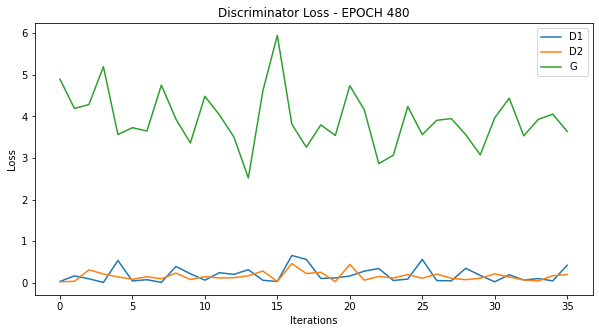

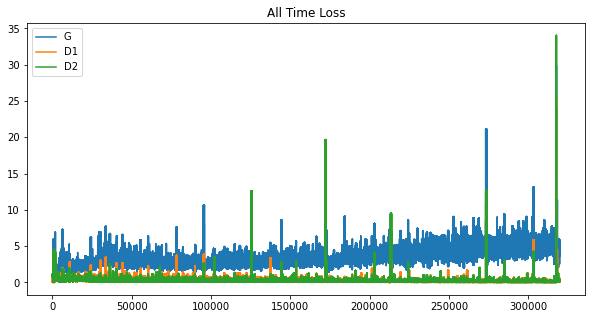

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 480/36, d1=0.161, d2=0.148, g=3.722
>1, 480/36, d1=0.008, d2=0.069, g=4.952
>2, 480/36, d1=0.372, d2=0.663, g=5.338
>3, 480/36, d1=0.303, d2=0.173, g=5.062
>4, 480/36, d1=0.127, d2=0.014, g=4.321
>5, 480/36, d1=0.292, d2=0.125, g=3.510
>6, 480/36, d1=0.140, d2=0.097, g=3.786
>7, 480/36, d1=0.048, d2=0.023, g=3.471
>8, 480/36, d1=0.032, d2=0.405, g=5.203
>9, 480/36, d1=0.300, d2=0.015, g=4.746
>10, 480/36, d1=0.051, d2=0.039, g=4.256
>11, 480/36, d1=0.324, d2=0.120, g=3.669
>12, 480/36, d1=0.201, d2=0.248, g=3.079
>13, 480/36, d1=0.086, d2=0.209, g=3.546
>14, 480/36, d1=0.046, d2=0.063, g=3.948
>15, 480/36, d1=0.126, d2=0.108, g=4.053
>16, 480/36, d1=0.252, d2=0.242, g=4.580
>17, 480/36, d1=0.193, d2=0.021, g=5.011
>18, 480/36, d1=0.225, d2=0.182, g=3.872
>19, 480/36, d1=0.047, d2=0.038, g=4.066
>20, 480/36, d1=0.045, d2=0.134, g=4.291
>21, 480/36, d1=0.041, d2=0.036, g=4.767
>22, 480/36, d1=0.053, d2=0.057, g=4.537
>23, 480/36, d1=0.049, d2=0.070, g=4.624
>24, 480/36, d1=0.176, d2=

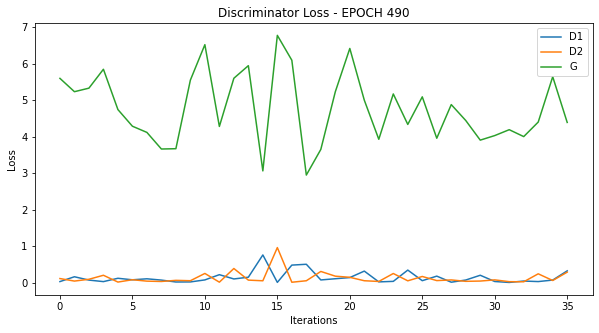

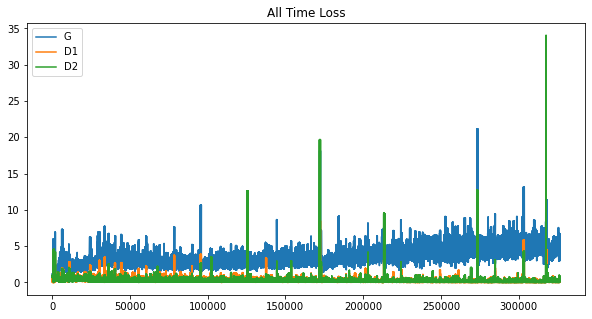

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>0, 490/36, d1=0.002, d2=0.447, g=5.618
>1, 490/36, d1=0.080, d2=0.153, g=6.957
>2, 490/36, d1=0.055, d2=0.015, g=7.054
>3, 490/36, d1=0.379, d2=0.038, g=3.924
>4, 490/36, d1=0.034, d2=0.051, g=3.860
>5, 490/36, d1=0.012, d2=0.250, g=4.811
>6, 490/36, d1=0.120, d2=0.033, g=4.389
>7, 490/36, d1=0.022, d2=0.023, g=4.743
>8, 490/36, d1=0.180, d2=0.066, g=3.522
>9, 490/36, d1=0.004, d2=0.045, g=3.696
>10, 490/36, d1=0.002, d2=0.493, g=6.224
>11, 490/36, d1=0.277, d2=0.019, g=6.003
>12, 490/36, d1=0.295, d2=0.043, g=4.495
>13, 490/36, d1=0.137, d2=0.348, g=4.922
>14, 490/36, d1=0.077, d2=0.088, g=4.954
>15, 490/36, d1=0.059, d2=0.004, g=4.490
>16, 490/36, d1=0.131, d2=0.194, g=3.958
>17, 490/36, d1=0.023, d2=0.032, g=4.999
>18, 490/36, d1=0.022, d2=0.069, g=5.149
>19, 490/36, d1=0.073, d2=0.033, g=4.929
>20, 490/36, d1=0.045, d2=0.048, g=4.169
>21, 490/36, d1=0.073, d2=0.294, g=6.656
>22, 490/36, d1=0.093, d2=0.008, g=5.758
>23, 490/36, d1=0.178, d2=0.018, g=3.758
>24, 490/36, d1=0.039, d2=

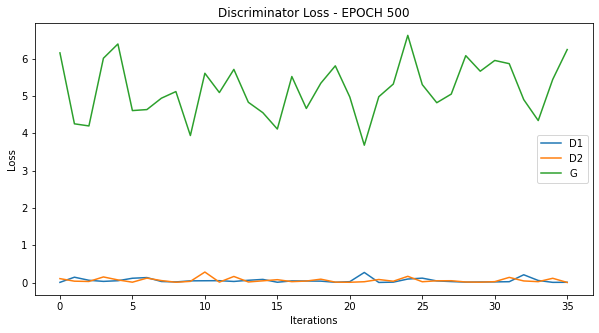

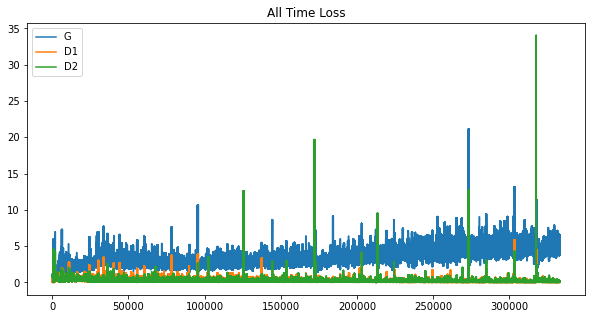

Mission completed: 5836.938798189163


In [48]:
from tqdm.notebook import trange, tqdm
import time
train(g_model, d_model, gan_model, X, latent_dim)

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras/engine/saving.py:341: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


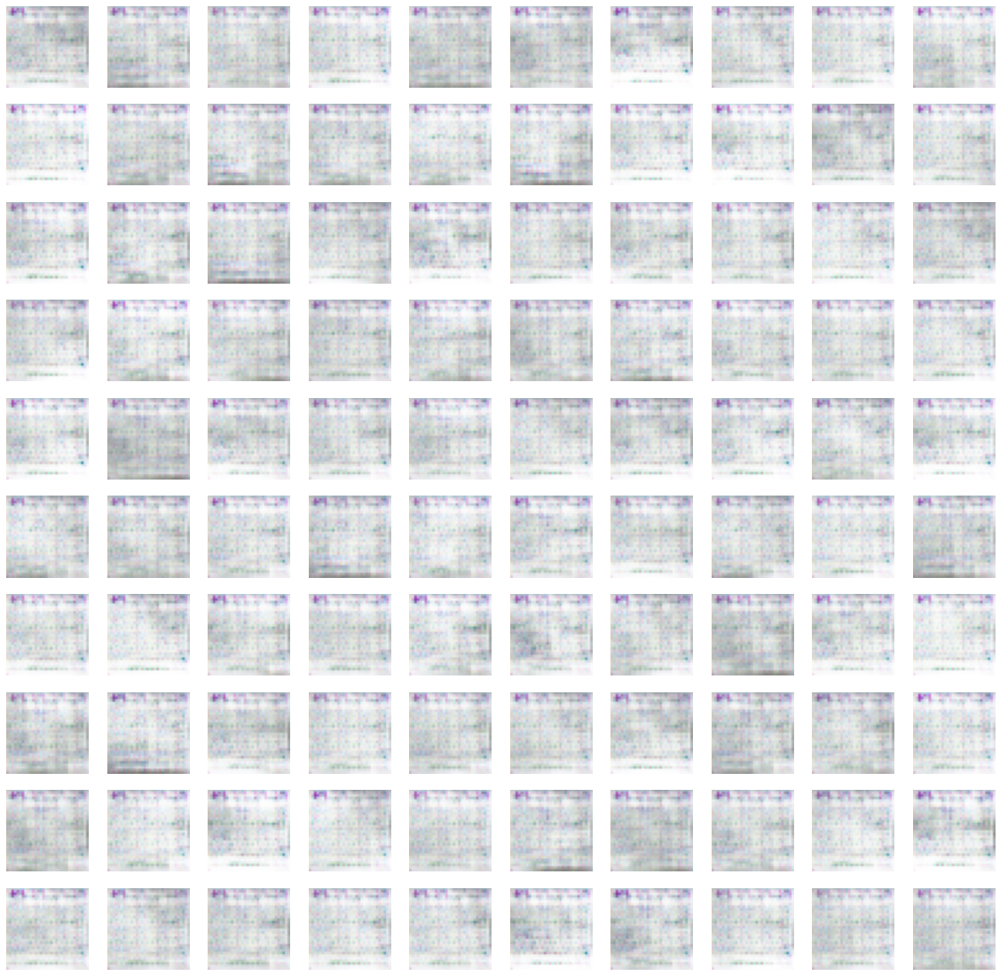

In [37]:
# example of loading the generator model and generating images
from keras.models import load_model
from numpy.random import randn

 
# plot the generated images
def create_plot(examples, n):
    # plot images
    fig = plt.figure(figsize=(20,20))
    for i in range(n * n):
        # define subplot
        plt.subplot(n, n, 1 + i)
        # turn off axis
        plt.axis('off')
        # plot raw pixel data
        plt.imshow(examples[i, :, :])
    plt.show()

#load model
model = load_model('generator_model_100.h5')
# generate images
latent_points = generate_latent_points(100, 100)
# generate images
X = model.predict(latent_points)
# scale from [-1,1] to [0,1]
X = (X + 1) / 2.0
# plot the result
create_plot(X, 10)